# Quality Control prediction for incoming goods.

### **Grzegorz Kowalczyk**
#### 01/03/2024

* **1 Introduction**
* **2 Load and check data**
    * 2.1 Load data
    * 2.2 Data dictionary
    * 2.3 Data types, empty strings
    * 2.4 Null and missing values
    * 2.5 Data distribution
* **3 Data preprocessing**
    * 3.1 Data cleaning
* **4 Filling missing Values**
    * 4.1 Age
* **5 Outlier detection??**      
* **5 Feature analysis**
    * 5.1 Numerical values
      
        * pcs_pck - log transformation and MinMax: pcs_pck_scaler
        * pcs_length_mm - bins
        * overall_weight_kg - log transformation
        * quantity_pcs - bins
        * pack_weight_kg - log transformation and MinMax: pack_weight_scaler
        * delivered_pcs_pack - dropped
  
    * 5.2 Categorical values
      
        * name
        * shape_no
        * drawing_no
        * surface_finish
        * supplier
  
* **6 Modeling**
    * 6.1 Simple modeling
        * Cross validate models
        * Hyperparameter tuning for best models
        * Plot learning curves
        * Feature importance of the tree-based classifiers
    * 6.2 Ensemble modeling
        * Combining models
    * 6.3 Prediction
        * Predict low occurance classes


## 1. Introduction
logiczny wykres tego co chesz storzyć, decyzja proces.
In the context of mid-sized manufacturing enterprises, factories often engage in the production of a multitude of products, necessitating the procurement of numerous parts and components from a diverse array of international suppliers, often employing dual sourcing strategies.

This project endeavors to develop a predictive model, leveraging real-world production data, specifically focusing on aluminum LED profiles manufacturing, with the objective of accurately classifying incoming goods as either 'OK' or 'NOK' (not OK).

A robust working model, enhanced with additional refinements, holds the potential to provide valuable insights not only to quality assurance personnel but also to logistics professionals, aiding in supplier selection processes. Moreover, it can serve as a tool for research and development teams, facilitating the identification of product features during the design phase that mitigate the likelihood of faulty deliveries.


In [102]:
import pandas as pd
# pd.set_option('display.max_rows', None)
import numpy as np
import regex as re
from datetime import datetime, timedelta
from random import randint
import missingno
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from collections import Counter
warnings.filterwarnings("ignore")
pd.options.display.float_format = '{:.2f}'.format
# !pip install openpyxl
# !pip install regex

## 2. Load and check data

### 2.1 load data

In [103]:
df = pd.read_excel('../Github depo/QC_encoded_data.xlsx')

In [104]:
df.head()

,date,finish,delivered_pcs_pack,pack_weight_kg,OK_NOK,pcs_lenght_mm,quantity_pcs,overal_weight_kg,pcs_pck,name_e,drawing_no_e,shape_no_e,supplier_e
0,"13,01,2017",color2,NaN,NaN,NOK,NaN,NaN,NaN,40.00,Lepus,DR0,SH0,SU0
1,"13,01,2017",color2,NaN,NaN,NOK,NaN,NaN,NaN,40.00,Sargas,DR1,SH1,SU0
2,"13,01,2017",color2,NaN,NaN,NOK,NaN,NaN,NaN,40.00,Lepus,DR0,SH0,SU0
3,"13,01,2017",color2,NaN,NaN,NOK,NaN,NaN,NaN,40.00,Lepus,DR0,SH0,SU0
4,"19,01,2017",color2,NaN,NaN,NOK,NaN,NaN,NaN,40.00,Hercules2,DR2,SH2,SU1


In [105]:
df.rename(columns={'overal_weight_kg': 'overall_weight_kg'}, inplace=True)

In [106]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6448 entries, 0 to 6447
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   date                6403 non-null   object 
 1   finish              6448 non-null   object 
 2   delivered_pcs_pack  4807 non-null   object 
 3   pack_weight_kg      2411 non-null   object 
 4   OK_NOK              6448 non-null   object 
 5   pcs_lenght_mm       4514 non-null   float64
 6   quantity_pcs        4514 non-null   object 
 7   overall_weight_kg   4488 non-null   float64
 8   pcs_pck             6350 non-null   float64
 9   name_e              6448 non-null   object 
 10  drawing_no_e        6448 non-null   object 
 11  shape_no_e          6448 non-null   object 
 12  supplier_e          6448 non-null   object 
dtypes: float64(3), object(10)
memory usage: 3.4 MB


Reorder the columns

In [107]:
new_order = ['OK_NOK','date', 'name_e', 'shape_no_e', 'drawing_no_e', 'finish', 'supplier_e', 'pcs_pck','delivered_pcs_pack', 'pack_weight_kg', 
       'pcs_lenght_mm', 'quantity_pcs', 'overall_weight_kg']

In [108]:
df = df[new_order]

In [109]:
df = df.rename(columns={'name_e' : 'name', 'shape_no_e' : 'shape_no', 'drawing_no_e': 'drawing_no', 'supplier_e': 'supplier', 'finish': 'surface_finish'})

In [110]:
df.head()

,OK_NOK,date,name,shape_no,drawing_no,surface_finish,supplier,pcs_pck,delivered_pcs_pack,pack_weight_kg,pcs_lenght_mm,quantity_pcs,overall_weight_kg
0,NOK,"13,01,2017",Lepus,SH0,DR0,color2,SU0,40.00,NaN,NaN,NaN,NaN,NaN
1,NOK,"13,01,2017",Sargas,SH1,DR1,color2,SU0,40.00,NaN,NaN,NaN,NaN,NaN
2,NOK,"13,01,2017",Lepus,SH0,DR0,color2,SU0,40.00,NaN,NaN,NaN,NaN,NaN
3,NOK,"13,01,2017",Lepus,SH0,DR0,color2,SU0,40.00,NaN,NaN,NaN,NaN,NaN
4,NOK,"19,01,2017",Hercules2,SH2,DR2,color2,SU1,40.00,NaN,NaN,NaN,NaN,NaN


In [111]:
df.describe()

,pcs_pck,pcs_lenght_mm,overall_weight_kg
count,6350.00,4514.00,4488.00
mean,38.54,4078.38,438.28
std,22.97,227.00,226.47
min,2.00,1500.00,0.00
25%,20.00,4050.00,258.39
50%,40.00,4150.00,450.36
75%,40.00,4150.00,568.22
max,100.00,5100.00,1702.41


Describe function shows only 3 columns which means only those 3 are numeric, I will address this issue later on.

## 2.2 Data dictionary

* 0.   **OK_NOK**:
      This column contains a target label   
* 1.   **date**:
      Date of delivery
* 2.   **name**:
      This column consist of aluminum profile names
* 3.   **shape_no**:
      Number that defines shape of the aluminium profile.
      Shape itself dosn't describe the final product because many suppliers can deliver the same shape in many colours and at different lenghts
* 4.   **drawing_no**:
      Describes a shape and supplier but dosn't contain information about colours and different lenghts
* 5.   **surface_finish**:
      Information about the colour of the profile
* 6.   **supplier**:
      Name of the supplier
* 7.   **pcs_pck**:
      Number of aluminium profiles that should be delivered in one package
* 8.   **delivered_pcs_pack**:
      Number of aluminium profiles that ware delivered in one package
* 9.   **pack_weight_kg**:
      Weight of one package
* 10.  **pcs_lenght_mm**:
      Lenght of the aluminium profiles
* 11.  **quantity_pcs**:
      How many pcs where delivered 
* 12.  **overall_weight_kg**:
      The overal weight delivered profiles

2.3 Early CatBoost Algorithm Prediction
Before diving into extensive data preprocessing, we often kickstart our analysis by running a preliminary CatBoost algorithm. This approach serves multiple purposes:

Baseline Performance Assessment: By applying CatBoost to our raw dataset, we obtain initial performance metrics that serve as a baseline for comparison. These metrics, including accuracy, precision, recall, and F1 score, provide insights into the algorithm's performance on unprocessed data.

Identification of Data Challenges: Running CatBoost early allows us to identify potential challenges within the dataset. Any significant discrepancies or anomalies in the performance metrics may indicate underlying issues such as data imbalance, missing values, or feature engineering requirements.

Hypothesis Generation: The initial results from CatBoost can spark hypotheses regarding feature importance and model behavior. Observing which features CatBoost deems significant in its initial run can guide our subsequent data preprocessing efforts and feature selection strategies.

Quick Iterative Feedback Loop: Running CatBoost early facilitates a quick iterative feedback loop. We can swiftly experiment with different preprocessing techniques and feature engineering approaches, iteratively refining our model based on the initial insights gained.

In this preliminary run, we split the dataset into training and testing sets, with 80% for training and 20% for testing. We employ CatBoost with categorical features specified and evaluate its performance using various metrics. Ultimately, we aim to gain initial insights into the dataset's predictability and establish a foundation for further model refinement and optimization.

Transforming target labels into binary format for classification. Now, our project's focus revolves around a clear distinction: 'OK' as 1 and 'NOK' as 0.



In [112]:
df['OK_NOK'] = df['OK_NOK'].map({'OK': 1, 'NOK': 0})

In [127]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix
from catboost import CatBoostClassifier


df.delivered_pcs_pack = df.delivered_pcs_pack.astype(str)
df.pack_weight_kg = df.pack_weight_kg.astype(str)
y = df['OK_NOK']
X = df.drop(['OK_NOK', 'date'], axis=1)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

cat_features = ['name','shape_no','drawing_no', 'surface_finish', 'supplier', 'delivered_pcs_pack','pack_weight_kg']
class_weights_dict = {0: 5, 1: 0.5}


In [114]:
catb = CatBoostClassifier(cat_features=cat_features, class_weights=class_weights_dict,random_state=42)

# Training the model
catb_model = catb.fit(X_train, y_train)

#Predict
ecat_pred = catb_model.predict(X_test)

# Scoring metrics
ecat_accuracy = accuracy_score(y_test, ecat_pred)
ecat_precision = precision_score(y_test, ecat_pred)
ecat_recall = recall_score(y_test, ecat_pred)
ecat_f1 = f1_score(y_test, ecat_pred,pos_label=1)
ecat_roc_auc = roc_auc_score(y_test, ecat_pred)

ecat_precision_negative = precision_score(y_test, ecat_pred, pos_label=0)
ecat_f1_negative = f1_score(y_test, ecat_pred, pos_label=0)

Learning rate set to 0.020757
0:	learn: 0.6827732	total: 22ms	remaining: 22s
1:	learn: 0.6714887	total: 49.9ms	remaining: 24.9s
2:	learn: 0.6621933	total: 62.3ms	remaining: 20.7s
3:	learn: 0.6517774	total: 85.8ms	remaining: 21.4s
4:	learn: 0.6424611	total: 112ms	remaining: 22.3s
5:	learn: 0.6337318	total: 129ms	remaining: 21.4s
6:	learn: 0.6252746	total: 145ms	remaining: 20.5s
7:	learn: 0.6181465	total: 161ms	remaining: 20s
8:	learn: 0.6098709	total: 182ms	remaining: 20s
9:	learn: 0.6025159	total: 204ms	remaining: 20.2s
10:	learn: 0.5961574	total: 214ms	remaining: 19.3s
11:	learn: 0.5901429	total: 224ms	remaining: 18.4s
12:	learn: 0.5829668	total: 248ms	remaining: 18.8s
13:	learn: 0.5764585	total: 273ms	remaining: 19.2s
14:	learn: 0.5704939	total: 294ms	remaining: 19.3s
15:	learn: 0.5647676	total: 318ms	remaining: 19.5s
16:	learn: 0.5595351	total: 343ms	remaining: 19.8s
17:	learn: 0.5537340	total: 365ms	remaining: 19.9s
18:	learn: 0.5489685	total: 385ms	remaining: 19.9s
19:	learn: 0.54

In [115]:
results = {
    'Accuracy': ecat_accuracy,
    'Precision': ecat_precision,
    'Recall': ecat_recall,
    'F1 Score': ecat_f1,

}
results_df = pd.DataFrame(results, index=['Early_CatBoost'])
results_df

,Accuracy,Precision,Recall,F1 Score
Early_CatBoost,0.75,0.95,0.73,0.82


In [116]:
confusion_matrix(y_test, ecat_pred)

array([[207,  38],
       [286, 759]], dtype=int64)

array([[ 99, 146],
       [ 87, 958]], dtype=int64)

The confussion matrix:
[TN, FP]
[FN, TP]

already shows us few things. 
Firstoff our negative class prediction is random and low in numbers as opposed to positive class and that idicates class imbalance. Let's check our test set class imbalnace.

In [117]:
y_test.value_counts()

OK_NOK
1    1045
0     245
Name: count, dtype: int64

In [118]:
# Negative class scores

# Calculate specificity
tn, fp, _, _ = confusion_matrix(y_test, ecat_pred).ravel()
ecat_specificity = tn / (tn + fp)

ecat_roc_auc = roc_auc_score(y_test, ecat_pred)
ecat_precision_negative = precision_score(y_test, ecat_pred, pos_label=0)
ecat_f1_negative = f1_score(y_test, ecat_pred, pos_label=0)

neg_class_results = {
    'ROC AUC': ecat_roc_auc,
    'Specificity': ecat_specificity,
    'Negative Precision': ecat_precision_negative,
    'Negative F1 Score': ecat_f1_negative,
}

neg_class_results_df =  pd.DataFrame(neg_class_results, index=['Early_CatBoost'])
Early_CatBoost_df = pd.concat([results_df, neg_class_results_df], axis=1)
Early_CatBoost_df

,Accuracy,Precision,Recall,F1 Score,ROC AUC,Specificity,Negative Precision,Negative F1 Score
Early_CatBoost,0.75,0.95,0.73,0.82,0.79,0.84,0.42,0.56


In [119]:

import pandas as pd

# Add predictions to the test DataFrame (X_test)
X_test['predicted'] = ecat_pred

# Add actual labels to the test DataFrame
X_test['actual'] = y_test.values

# Filter DataFrame for False Positives
false_positives = X_test[(X_test['predicted'] == 1) & (X_test['actual'] == 0)]

# Display or analyze the filtered DataFrame
false_positives


,name,shape_no,drawing_no,surface_finish,supplier,pcs_pck,delivered_pcs_pack,pack_weight_kg,pcs_lenght_mm,quantity_pcs,overall_weight_kg,predicted,actual
2338,Mirzam,SH69,DR82,color2,SU1,20.00,20,nan,4050.00,140,239.27,1,0
2558,Dorado,SH30,DR33,color2,SU0,40.00,40,nan,4150.00,468,423.40,1,0
3436,Aldebaran,SH4,DR4,CZARNY,SU1,8.00,8,nan,4050.00,96,369.36,1,0
4736,Dorado,SH30,DR104,color2,SU2,40.00,40,45,4150.00,600,542.82,1,0
4311,Sextans,SH7,DR7,color3,SU1,20.00,24,37.5,4150.00,128,200.26,1,0
4489,Cancer,SH0,DR39,BIAŁY,SU1,40.00,40,26.5,4050.00,1164,546.85,1,0
3099,Aldebaran,SH4,DR4,CZARNY,SU1,8.00,8,nan,4050.00,80,NaN,1,0
2268,Dziban,SH23,DR25,color1,SU1,10.00,12,nan,4050.00,108,270.75,1,0
4310,Sextans,SH7,DR7,color3,SU1,20.00,24,37.5,4150.00,40,62.58,1,0
3728,Gemini2,SH17,DR18,color2,SU1,20.00,20,nan,4150.00,144,224.10,1,0


## 2.3 Data types, empty strings

**Comment**: Since our target is binary classification we can map OK = 1 and NOK = 0

In [120]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6448 entries, 0 to 6447
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   OK_NOK              6448 non-null   int64  
 1   date                6403 non-null   object 
 2   name                6448 non-null   object 
 3   shape_no            6448 non-null   object 
 4   drawing_no          6448 non-null   object 
 5   surface_finish      6448 non-null   object 
 6   supplier            6448 non-null   object 
 7   pcs_pck             6350 non-null   float64
 8   delivered_pcs_pack  6448 non-null   object 
 9   pack_weight_kg      6448 non-null   object 
 10  pcs_lenght_mm       4514 non-null   float64
 11  quantity_pcs        4514 non-null   object 
 12  overall_weight_kg   4488 non-null   float64
dtypes: float64(3), int64(1), object(9)
memory usage: 655.0+ KB


**Comment**: The columns:
* 'delivered_pcs_pack',
* 'pack_weight_kg',
* 'quantity_pcs'
  
   are mix of strings, numeric and nans that I need to handle first.

* **delivered_pcs_pack'**

In [121]:
delivered_pcs_vc = df['delivered_pcs_pack'].value_counts(dropna=False)
delivered_pcs_vc

delivered_pcs_pack
40         2030
nan        1641
20         1356
100         399
60          313
10          271
50          169
30           77
24           61
25           24
12           17
8            16
18           13
32           11
40 / 60       7
28            7
6             4
80            4
0             3
15            3
21            3
42            3
BRAK          2
48            2
20 SZT        1
250           1
-             1
120           1
7             1
53            1
39            1
65            1
0.25          1
1             1
2             1
16            1
Name: count, dtype: int64

In [122]:
# Change the type of whole column to str

df['delivered_pcs_pack'] = df['delivered_pcs_pack'].astype(str)

# Filter out rows containing '40 / 60'
filtered_df = df[df['delivered_pcs_pack'].str.contains('40 / 60')]


In [123]:
#  Replace values, strip white spaces:

df['delivered_pcs_pack'] = df['delivered_pcs_pack'].replace(['20 SZT', 'BRAK', '-', '0', '40 / 60'], ['20', 'np.nan', 'np.nan', 'np.nan', '40']).str.strip()

# Change the whole column back to numeric

df['delivered_pcs_pack'] = pd.to_numeric(df['delivered_pcs_pack'], errors='coerce')


In [124]:
df['OK_NOK'].value_counts()

OK_NOK
1    5224
0    1224
Name: count, dtype: int64

* **pack_weight_kg**

In [84]:
df['pack_weight_kg'].isnull().sum()

0

In [85]:

# Get the type of each element in the column
types_series = df['pack_weight_kg'].apply(type)

# Count the occurrences of each type
type_counts = types_series.value_counts()

print(type_counts)



pack_weight_kg
<class 'str'>    6448
Name: count, dtype: int64


In [86]:
pack_weight_kg_vc = df['pack_weight_kg'].value_counts(dropna=False)
filtered_pack_weight_kg_vc = pack_weight_kg_vc[pack_weight_kg_vc<2]


In [87]:
df['pack_weight_kg'] =  pd.to_numeric(df['pack_weight_kg'], errors='coerce')
df['pack_weight_kg'] = df['pack_weight_kg'].round(decimals=1)
df['pack_weight_kg'].value_counts(dropna=False).index

Index([  nan,  27.0,  32.2,  21.4,  22.7,  31.3,  25.4,  19.4,  27.1,  32.0,
       ...
        40.6,  40.7,  34.4,  43.5,  55.0,  39.5,  48.5, 350.0,  18.5,  12.2],
      dtype='float64', name='pack_weight_kg', length=259)

* **quantity_pcs**

In [88]:
quantity_pcs_vc = df['quantity_pcs'].value_counts(dropna=False)

In [89]:
df['quantity_pcs'] = pd.to_numeric(df['quantity_pcs'], errors='coerce')

In [90]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6448 entries, 0 to 6447
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   OK_NOK              0 non-null      float64
 1   date                6403 non-null   object 
 2   name                6448 non-null   object 
 3   shape_no            6448 non-null   object 
 4   drawing_no          6448 non-null   object 
 5   surface_finish      6448 non-null   object 
 6   supplier            6448 non-null   object 
 7   pcs_pck             6350 non-null   float64
 8   delivered_pcs_pack  4801 non-null   float64
 9   pack_weight_kg      2405 non-null   float64
 10  pcs_lenght_mm       4514 non-null   float64
 11  quantity_pcs        4513 non-null   float64
 12  overall_weight_kg   4488 non-null   float64
dtypes: float64(7), object(6)
memory usage: 655.0+ KB


In [91]:
df.describe()

,OK_NOK,pcs_pck,delivered_pcs_pack,pack_weight_kg,pcs_lenght_mm,quantity_pcs,overall_weight_kg
count,0.00,6350.00,4801.00,2405.00,4514.00,4513.00,4488.00
mean,NaN,38.54,38.57,27.55,4078.38,705.67,438.28
std,NaN,22.97,22.79,10.22,227.00,591.61,226.47
min,NaN,2.00,0.25,0.00,1500.00,0.00,0.00
25%,NaN,20.00,20.00,22.10,4050.00,260.00,258.39
50%,NaN,40.00,40.00,27.00,4150.00,525.00,450.36
75%,NaN,40.00,40.00,32.20,4150.00,1000.00,568.22
max,NaN,100.00,250.00,350.00,5100.00,5200.00,1702.41


#### 2.4 Null and missing values

In [92]:
df.isnull().sum().sort_values(ascending=False)

OK_NOK                6448
pack_weight_kg        4043
overall_weight_kg     1960
quantity_pcs          1935
pcs_lenght_mm         1934
delivered_pcs_pack    1647
pcs_pck                 98
date                    45
name                     0
shape_no                 0
drawing_no               0
surface_finish           0
supplier                 0
dtype: int64

<Axes: >

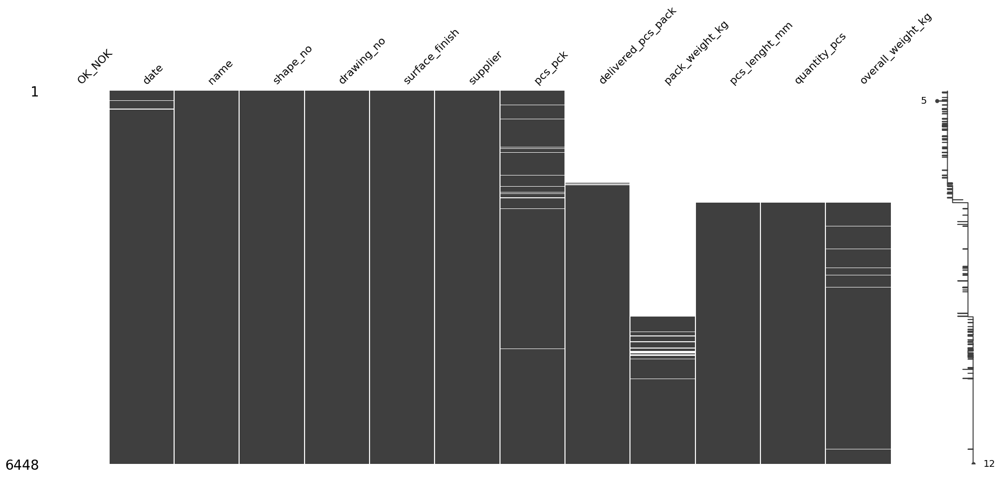

In [93]:
missingno.matrix(df)

<Axes: >

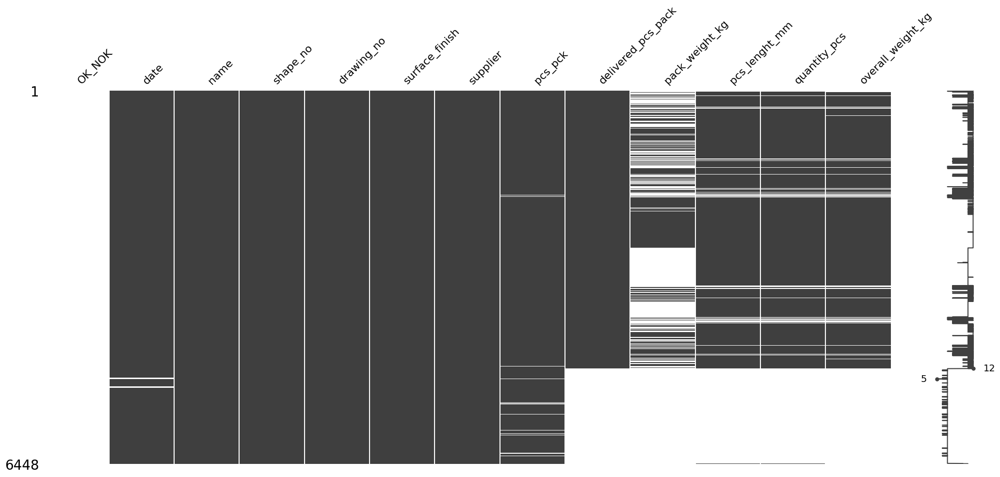

In [94]:
sorted_delivered_pcs_pack = df.sort_values('delivered_pcs_pack')
missingno.matrix(sorted_delivered_pcs_pack)

### 2.5 Data distribution

**Comment**: Since the data is about the delivery of goods some products will be delivered more frequent than others. Let's check how the products are represented in the dataset by using seaborn count plot.

In [132]:
# filtering a list of unique deliveries.
vc_combo = df[['drawing_no', 'surface_finish','name']].apply(tuple, axis=1).value_counts()
vc_combo

(DR5, color2, Vindemiatrix)     270
(DR1, color2, Sargas)           250
(DR0, color2, Lepus)            237
(DR10, color2, Vindemiatrix)    234
(DR20, color2, Sargas)          205
                               ... 
(DR113, color1, Alcyone)          1
(DR112, color1, Monoceros)        1
(DR169, color2, Pegasus2)         1
(DR170, color1, Mirach)           1
(DR143, color3, Delphinus)        1
Name: count, Length: 352, dtype: int64

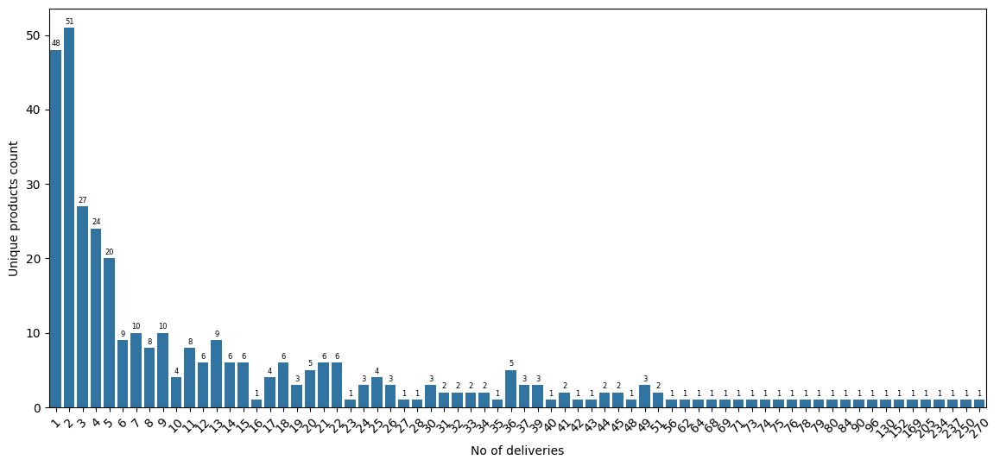

In [133]:
plt.figure(figsize=(14, 6))
ax = sns.countplot(data=df, x=vc_combo)
plt.xlabel('No of deliveries')
plt.ylabel('Unique products count')
plt.xticks(rotation=45);


for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', fontsize=6, color='black', xytext=(0, 5),
                textcoords='offset points')
plt.show()

**Comment**:

Observation: There appears to be a substantial cluster of unique deliveries with occurrences of less than 10. Various factors could contribute to this phenomenon, including the introduction of new products, low sales volume items, sporadic deliveries from suppliers (e.g., cargo shipping), or discontinued relationships with underperforming suppliers. A critical inference drawn from this observation is that predictive modeling based on such sparse data instances may yield unreliable results.

Recommendation: In the subsequent modeling phase of this project, it is advisable to filter out products with fewer than 5 deliveries. This strategic approach aims to enhance the robustness of the model by focusing on more representative data points. Additionally, this filtering criterion should undergo thorough validation during model evaluation to ensure its effectiveness in improving predictive accuracy and generalizability.

**Comment:** There is at least 150 unique products that we wont be able to predict. Now let's check class distribution.

In [134]:
ok_nok_vc = df['OK_NOK'].value_counts()
percentage_0 = ok_nok_vc[0] / ok_nok_vc.sum() * 100
percentage_1 = ok_nok_vc[1] / ok_nok_vc.sum() * 100

print(f"Percentage of class 0: {percentage_0:.2f}%")
print(f"Percentage of class 1: {percentage_1:.2f}%")

Percentage of class 0: 18.98%
Percentage of class 1: 81.02%


**Comment:** 

Observation: The dataset reveals a substantial class imbalance, with Class 1 being approximately 5 times more represented than Class 0. This observation aligns with business realities, as an equal distribution of NOK (Not OK) deliveries would impede operational efficiency. However, the presence of 18% NOK deliveries signifies significant room for improvement in the delivery process.

Recommendation: Addressing the high percentage of NOK deliveries presents an opportunity to enhance overall performance and customer satisfaction. Implementing strategies to reduce NOK occurrences, such as refining quality control measures, optimizing supplier relationships, and enhancing delivery logistics, can lead to substantial improvements in business outcomes and stakeholder satisfaction.

### 3. Data preprocesing

### 3.1 Data cleaning - date column

**Comment**: Before proceeding with datetime conversion, it's essential to inspect the 'Date' column values to assess the variety of formats present, likely due to manual entry by QC personnel over the years. This initial exploration will provide insights into the range of formats and values encountered, facilitating the development of an appropriate cleaning strategy.

In [135]:
df['date'].apply(type).nunique()

3

In [136]:
df['date'].apply(type).value_counts()

date
<class 'datetime.datetime'>    4621
<class 'str'>                  1782
<class 'float'>                  45
Name: count, dtype: int64

In [137]:
df.head(2)

,OK_NOK,date,name,shape_no,drawing_no,surface_finish,supplier,pcs_pck,delivered_pcs_pack,pack_weight_kg,pcs_lenght_mm,quantity_pcs,overall_weight_kg
0,0,"13,01,2017",Lepus,SH0,DR0,color2,SU0,40.00,nan,nan,NaN,NaN,NaN
1,0,"13,01,2017",Sargas,SH1,DR1,color2,SU0,40.00,nan,nan,NaN,NaN,NaN


In [138]:
df.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6448 entries, 0 to 6447
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   OK_NOK              6448 non-null   int64  
 1   date                6403 non-null   object 
 2   name                6448 non-null   object 
 3   shape_no            6448 non-null   object 
 4   drawing_no          6448 non-null   object 
 5   surface_finish      6448 non-null   object 
 6   supplier            6448 non-null   object 
 7   pcs_pck             6350 non-null   float64
 8   delivered_pcs_pack  6448 non-null   object 
 9   pack_weight_kg      6448 non-null   object 
 10  pcs_lenght_mm       4514 non-null   float64
 11  quantity_pcs        4514 non-null   object 
 12  overall_weight_kg   4488 non-null   float64
dtypes: float64(3), int64(1), object(9)
memory usage: 3.4 MB


**Comment**: Let's check last entry, and NaN values:

In [139]:
df.date.iloc[-1]

datetime.datetime(2022, 9, 13, 0, 0)

In [140]:
df.date.isnull().sum()

45

**Comment**: Now I will create new column to check if there are any strings present in date column:

In [141]:
df['is_str'] = df.date.apply(lambda x: True if isinstance(x, str) else False)

In [142]:
df['is_str'].value_counts()

is_str
False    4666
True     1782
Name: count, dtype: int64

**Comment**: As Expected nearly 1,8k rows are strings, lets move the column closer to date column to have a better view, and let's see if those strings contain any letters.

In [143]:
df.insert(2, 'is_str', df.pop('is_str'))


In [144]:
letter_pattern = re.compile(r"[a-zA-Z]")

In [145]:
filter_letter_pattern = df.loc[df['is_str']==True, 'date'].apply(lambda x: True if letter_pattern.search(x) else False)

In [150]:
len(filter_letter_pattern[filter_letter_pattern].index)

54

**Comment**: Out of all elements from date column that are strings 54 contain letters, which isnt that bad considering 1,8k strings.
My approach is to focus on strings that are not letters and try to convert those in to proper datetime format.
I will create new column date_fmt and I will use it to perform all operations there without risking loosing any valid data.

In [151]:
df.loc[df['is_str']==True,'date_fmt'] = df.loc[df['is_str']==True,'date']

In [152]:
df.insert(2, 'date_fmt', df.pop('date_fmt'))

In [153]:
df['date_fmt'] = df.loc[df['is_str']==True,'date_fmt'].str.replace(',', '.').str.replace('/', '.')

In [154]:
df

,OK_NOK,date,date_fmt,is_str,name,shape_no,drawing_no,surface_finish,supplier,pcs_pck,delivered_pcs_pack,pack_weight_kg,pcs_lenght_mm,quantity_pcs,overall_weight_kg
0,0,"13,01,2017",13.01.2017,True,Lepus,SH0,DR0,color2,SU0,40.00,nan,nan,NaN,NaN,NaN
1,0,"13,01,2017",13.01.2017,True,Sargas,SH1,DR1,color2,SU0,40.00,nan,nan,NaN,NaN,NaN
2,0,"13,01,2017",13.01.2017,True,Lepus,SH0,DR0,color2,SU0,40.00,nan,nan,NaN,NaN,NaN
3,0,"13,01,2017",13.01.2017,True,Lepus,SH0,DR0,color2,SU0,40.00,nan,nan,NaN,NaN,NaN
4,0,"19,01,2017",19.01.2017,True,Hercules2,SH2,DR2,color2,SU1,40.00,nan,nan,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6443,1,2022-09-13 00:00:00,NaN,False,Caph,SH82,DR111,color2,SU1,100.00,100.0,38.2,4150.00,900,343.62
6444,1,2022-09-13 00:00:00,NaN,False,Caph,SH82,DR111,color2,SU1,100.00,100.0,38.2,4150.00,920,351.26
6445,1,2022-09-13 00:00:00,NaN,False,Subra,SH10,DR11,color1,SU1,60.00,40.0,12.2,4050.00,1590,482.96
6446,1,2022-09-13 00:00:00,NaN,False,Sirius,SH15,DR16,color1,SU1,100.00,40.0,10.5,4050.00,2032,534.92


In [155]:
df['date_fmt'] = pd.to_datetime(df['date_fmt'], format='%d.%m.%Y', errors='coerce')

In [156]:
df['date_fmt'] = df['date_fmt'].dt.strftime('%Y-%m-%d %H:%M:%S')

**Comment**: Now I will copy over from date column the data that are not strings and convert them to datetime.

In [157]:
df.loc[df['is_str']==False, 'date_fmt'] = pd.to_datetime(df.loc[df['is_str']==False, 'date'], format='%Y-%m-%d %H:%M:%S')

In [158]:
df['date_fmt'] = pd.to_datetime(df['date_fmt'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

**Comment**: After successfully converting the majority of the data to datetime format, the next step involves addressing the remaining NaT (Not a Time) values.

In [159]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6448 entries, 0 to 6447
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   OK_NOK              6448 non-null   int64         
 1   date                6403 non-null   object        
 2   date_fmt            6345 non-null   datetime64[ns]
 3   is_str              6448 non-null   bool          
 4   name                6448 non-null   object        
 5   shape_no            6448 non-null   object        
 6   drawing_no          6448 non-null   object        
 7   surface_finish      6448 non-null   object        
 8   supplier            6448 non-null   object        
 9   pcs_pck             6350 non-null   float64       
 10  delivered_pcs_pack  6448 non-null   object        
 11  pack_weight_kg      6448 non-null   object        
 12  pcs_lenght_mm       4514 non-null   float64       
 13  quantity_pcs        4514 non-null   object      

**Comment**: I've opted to manually inspect all remaining NaT (Not a Time) values to retrieve any salvageable data.

In [160]:
original_max_rows = pd.options.display.max_rows

# Temporarily set display options to show all rows
pd.options.display.max_rows = None

# Run the query
result = df.query('date_fmt.isnull()')
# result

In [161]:
df.loc[72, 'date_fmt'] = '2016.10.12'
df.loc[74, 'date_fmt'] = '2016.10.10'
df.loc[233, 'date_fmt'] = '2016.10.12'
df.loc[426, 'date_fmt'] = '2016.03.28'
df.loc[894, 'date_fmt'] = '2018.02.21'
df.loc[1532, 'date_fmt'] = '2018.09.12'
df.loc[1777, 'date_fmt'] = '2018.11.21'
df.loc[1908, 'date_fmt'] = '2018.12.12'

In [162]:
df['date_fmt'] = pd.to_datetime(df['date_fmt'], format='%Y-%m-%d %H:%M:%S', errors='coerce')

In [163]:
pd.options.display.max_rows = original_max_rows

**Comment**: Now, it's time to address the remaining missing data. Given that this table is filled in chronological order and that most of the missing data have low indexes, we can infer that these inspections were likely conducted around 2016.

In [164]:
def random_date(year):
    starting_date = datetime(year, 1, 1)
    stopping_date = datetime(year, 12, 31)
    random_days = randint(0, (stopping_date - starting_date).days)
    return starting_date + timedelta(days=random_days)

In [165]:
df.loc[df['date_fmt'].isnull(), 'date_fmt'] = random_date(2016)

In [166]:
df['date_fmt'].isnull().sum()

0

In [167]:
df.drop(['date', 'is_str'],  axis=1, inplace=True)

**Comment**  I noticed that some dates are set for future occurrences. It seems like this might be because of using the drag-and-drop function in Excel. It looks like someone tried to copy the dates across cells, maintaining the day and month but accidentally changing the year in each cell.

In [168]:
sorted_date_fmt = df.date_fmt.sort_values(ascending=False)
sorted_date_fmt[sorted_date_fmt>'01.01.2023']
sorted_date_fmt_idx = sorted_date_fmt[sorted_date_fmt>'01.01.2023'].index
sorted_date_fmt_idx


Index([1479, 1478, 1477, 1347, 1476, 1346, 1345, 1474, 1344], dtype='int64')

In [169]:
idx_to_change = df.loc[1340:1347].index

In [170]:
idx_to_change2 = df.loc[1470:1479].index

In [171]:
idx_to_change_combined = idx_to_change.append(idx_to_change2)

In [172]:
idx_to_change_combined

Index([1340, 1341, 1342, 1343, 1344, 1345, 1346, 1347, 1470, 1471, 1472, 1473,
       1474, 1475, 1476, 1477, 1478, 1479],
      dtype='int64')

In [173]:
for idx in idx_to_change_combined:
    df.loc[idx, 'date_fmt'] = df.loc[idx, 'date_fmt'].replace(year=int(2018))

### 3.2 Data cleaning - rest of the columns
**Comment**: Fortunately, all string columns have been pre-processed during the encoding process, ensuring data uniformity. This encoding was implemented to render the products unrecognizable, thus complying with legal requirements.

In [174]:
df['name'].apply(type).nunique()

1

In [175]:
df['name'].apply(type).value_counts()

name
<class 'str'>    6448
Name: count, dtype: int64

In [176]:
df['name'] = df['name'].astype(str)

In [177]:
df['shape_no'].apply(type).nunique()

1

In [178]:
df['shape_no'] = df['shape_no'].astype(str)

In [179]:
df['drawing_no'].apply(type).nunique()

1

In [180]:
df['drawing_no'] = df['drawing_no'].astype(str)

In [181]:
df['surface_finish'].apply(type).nunique()

1

In [182]:
df['surface_finish'] = df['surface_finish'].astype(str)

In [183]:
df['supplier'].apply(type).nunique()

1

In [184]:
df['supplier'] = df['supplier'].astype(str)

In [185]:
df.describe()

,OK_NOK,date_fmt,pcs_pck,pcs_lenght_mm,overall_weight_kg
count,6448.00,6448,6350.00,4514.00,4488.00
mean,0.81,2020-03-11 23:55:58.808932864,38.54,4078.38,438.28
min,0.00,2002-05-19 00:00:00,2.00,1500.00,0.00
25%,1.00,2018-10-01 00:00:00,20.00,4050.00,258.39
50%,1.00,2020-07-02 00:00:00,40.00,4150.00,450.36
75%,1.00,2021-08-31 00:00:00,40.00,4150.00,568.22
max,1.00,2022-09-13 00:00:00,100.00,5100.00,1702.41
std,0.39,NaN,22.97,227.00,226.47


In [186]:
df.loc[4626,'pack_weight_kg'] = float(36.00)
df.loc[4626]

OK_NOK                                  1
date_fmt              2021-07-13 00:00:00
name                                 Alya
shape_no                             SH42
drawing_no                           DR46
surface_finish                     color1
supplier                              SU1
pcs_pck                             40.00
delivered_pcs_pack                   40.0
pack_weight_kg                      36.00
pcs_lenght_mm                     4050.00
quantity_pcs                          350
overall_weight_kg                  314.69
Name: 4626, dtype: object

In [187]:
quantity_pcs_vc = df['quantity_pcs'] .value_counts()
quantity_pcs_vc
filtered_quantity_pcs_vc = quantity_pcs_vc[quantity_pcs_vc.index<100].sort_values(ascending=False)
row_index_vc = df[df['quantity_pcs'].isin(filtered_quantity_pcs_vc.index)].index
row_index_vc

TypeError: '<' not supported between instances of 'str' and 'int'

**Comment**: "The 'quantity_pcs' column represents the volume of each delivery. Generally, quantities below 100 pieces per delivery may indicate special cases like prototype orders, overproduction, or underproduction, rather than standard delivery volumes which usually are much grater. It's crucial to exclude such instances from our model training to prevent bias or inaccuracies. Segregating and excluding these outliers ensures the reliability of our model for analyzing regular deliveries."

In [ ]:
df.drop(row_index_vc, axis=0, inplace=True)
df.reset_index(drop=True, inplace=True)

**Comment**: The Describe Function Indicates Presence of Zero Values in the 'pack_weight_kg' Column: Zero values in the 'pack_weight_kg' column require attention and should be addressed to ensure data accuracy and integrity.

In [78]:
df['pack_weight_kg'] = df['pack_weight_kg'].replace(0, np.nan)

### 4. Filling missing Values

In [190]:
df.isnull().sum().sort_values(ascending=False)

overall_weight_kg     1960
pcs_lenght_mm         1934
quantity_pcs          1934
pcs_pck                 98
OK_NOK                   0
date_fmt                 0
name                     0
shape_no                 0
drawing_no               0
surface_finish           0
supplier                 0
delivered_pcs_pack       0
pack_weight_kg           0
dtype: int64

In [198]:
df[df['overall_weight_kg'].isnull()].index

Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
       ...
       3442, 3474, 3845, 3896, 4005, 4152, 4213, 4881, 6192, 6193],
      dtype='int64', length=1960)

In [80]:
def input_missing_values_recursive(df, column_with_nan, max_num_iter=3, iter_count=0):
    """
    Recursively fills missing values in a DataFrame column based on corresponding values from the same DataFrame.
    
    Args:
        df (DataFrame): The DataFrame containing missing values to be filled.
        column_with_nan (str): The name of the column containing missing values.
        max_num_iter (int): Maximum number of iterations to perform recursive filling.
        iter_count (int): Current iteration count (used internally for recursion).
        
    Returns:
        None. The function modifies the DataFrame in place.
    """
    # Base case: If maximum number of iterations reached, exit function
    if iter_count >= max_num_iter:
        return
    
    # Iterate over rows in the DataFrame
    for idx, row in df.iterrows():
        # Extract values from current row
        drawing_no = row['drawing_no']
        finish = row['surface_finish']
        name = row['name']
        corresponding_val = None

        # Try to find a corresponding non-null value in the DataFrame
        try:
            corresponding_val = df.loc[(df['drawing_no'] == drawing_no) &
                                       (df['surface_finish'] == finish) &
                                       (df['name'] == name) &
                                       (df[column_with_nan].notnull()), column_with_nan].iloc[0]
        except IndexError:
            corresponding_val = None
        
        # If a corresponding value is found, fill the missing value in the current row
        if corresponding_val is not None:
            df.loc[idx, column_with_nan] = corresponding_val
            
    # Recursively call the function to continue filling missing values
    input_missing_values_recursive(df, column_with_nan, max_num_iter, iter_count + 1)

# input_missing_values_recursive(df, 'pack_weight_kg')
# input_missing_values_recursive(df, 'pcs_lenght_mm')
# input_missing_values_recursive(df, 'delivered_pcs_pack')
# input_missing_values_recursive(df, 'pcs_pck')

**Coment** The recursive function takes a considerable amount of time to run and only needs to be executed once. Therefore, I opted to store the result in a new modified DataFrame (modified_df) and commented out function calls to avoid unnecessary recalculations.

In [81]:
# df.to_csv('modified_dataframe.csv', index=False)

In [82]:
modified_df = pd.read_csv('modified_dataframe.csv')

In [83]:
modified_df['date_fmt'] = pd.to_datetime(modified_df['date_fmt'])

In [84]:
modified_df.isnull().sum().sort_values(ascending=False)

overall_weight_kg     1948
quantity_pcs          1935
pack_weight_kg         340
pcs_lenght_mm          168
pcs_pck                 97
delivered_pcs_pack      76
OK_NOK                   0
date_fmt                 0
name                     0
shape_no                 0
drawing_no               0
surface_finish           0
supplier                 0
dtype: int64

**Comment** The "input_missing_values_recursive()" function has successfully filled in the majority of the missing data. Now, it's time to address the remaining missing values.

In [85]:
pack_weight_kg_median = modified_df['pack_weight_kg'].median()
modified_df['pack_weight_kg'] = modified_df['pack_weight_kg'].fillna(pack_weight_kg_median)

In [86]:
pcs_lenght_mm_median = modified_df['pcs_lenght_mm'].median()
modified_df['pcs_lenght_mm'] = modified_df['pcs_lenght_mm'].fillna(pcs_lenght_mm_median)

In [87]:
quantity_pcs_median = modified_df['quantity_pcs'].median()
modified_df['quantity_pcs'] = modified_df['quantity_pcs'].fillna(quantity_pcs_median)

In [88]:
delivered_pcs_pack_mode = modified_df['delivered_pcs_pack'].mode()
modified_df['delivered_pcs_pack'] = modified_df['delivered_pcs_pack'].fillna(delivered_pcs_pack_mode[0])


In [89]:
pcs_pack_mode = modified_df['pcs_pck'].mode()
modified_df['pcs_pck'] = modified_df['pcs_pck'].fillna(pcs_pack_mode[0])

**Comment** The 'overall_weight_kg' column contains NaNs and zeroes, which shouldn't be filled with median values. Doing so could potentially result in misleading information since the overall weight primarily depends on the quantity and weight of individual packets. Fortunately, we have both of these features available. Instead of using a median, let's devise a logic to recalculate the weight for each sample based on its individual packet quantities and weights.

In [90]:
overall_weight_kg_na_idx = modified_df.loc[(modified_df['overall_weight_kg'].isnull()) | (modified_df['overall_weight_kg']== 0)].index

overall_weight_kg_na_idx

Index([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,
       ...
       5323, 5453, 5454, 5607, 5896, 5897, 5918, 5919, 6027, 6132],
      dtype='int64', length=1967)

In [91]:
# Iterate over the indices of rows with missing values in 'overal_weight_kg'
for idx in overall_weight_kg_na_idx:
    # Extract necessary values from the DataFrame
    quantity_pcs = modified_df.loc[idx, 'quantity_pcs']
    pcs_pck = modified_df.loc[idx, 'pcs_pck']
    pack_weight_kg = modified_df.loc[idx,'pack_weight_kg']
    
    # Calculate corresponding overall weight
    corresponding_overal_weight = (quantity_pcs / pcs_pck) * pack_weight_kg
    
    # Assign the calculated overall weight to the corresponding row in 'overal_weight_kg' column
    modified_df.loc[idx, 'overall_weight_kg'] = corresponding_overal_weight

**Comment**: Additionaly its better to change units from millimeters and kilograms to meters and tonnes.

In [92]:
for idx, row in modified_df.iterrows():
    # Extract values from the current row
    lenght_mm = row['pcs_lenght_mm']
    weight_kg = row['overall_weight_kg']
    # Convert length and weight to meters and kilograms, respectively
    converted_lenght = lenght_mm / 1000
    converted_weight = weight_kg / 1000

    modified_df.loc[idx, 'pcs_lenght_mm'] = converted_lenght
    modified_df.loc[idx, 'overall_weight_kg'] = converted_weight

In [93]:
modified_df = modified_df.rename(columns={'pcs_lenght_mm' : 'pcs_lenght_m', 'overall_weight_kg': 'overall_weight_t'})


In [94]:
modified_df.isnull().sum().sort_values(ascending=False)

OK_NOK                0
date_fmt              0
name                  0
shape_no              0
drawing_no            0
surface_finish        0
supplier              0
pcs_pck               0
delivered_pcs_pack    0
pack_weight_kg        0
pcs_lenght_m          0
quantity_pcs          0
overall_weight_t      0
dtype: int64

### 5 Feature analysis
     5.1 Numerical values:
     * "pcs_pck",
     * "pcs_lenght_mm",
     * "overall_weight_kg",
     * "quantity_pcs",
     * "pack_weight_kg",
     * "delivered_pcs_pack"

**Comment** Before we begin to anylise the dataset let's remove those unique deliveries that occured less than 5 times.

In [95]:
# Group by the three columns and count occurrences
combo_counts = modified_df.groupby(['drawing_no', 'surface_finish', 'name']).size()

# Filter combinations with counts less than 5
filtered_combos = combo_counts[combo_counts < 5].index

# Filter the DataFrame based on the filtered combinations
modified_df = modified_df[~modified_df[['drawing_no', 'surface_finish', 'name']].apply(tuple, axis=1).isin(filtered_combos)]
combo_counts

drawing_no  surface_finish  name    
DR0         C-0             Regor       237
            C-35            Nebula        7
            SUR             Nunki        39
DR1         C-0             Procyon     249
            C-35            Pulsar        6
                                       ... 
DR97        C-0             Zavijava     14
DR98        C-0             Virgo1       19
DR99        C-0             Orion         9
            C-35            Rigel         2
            SUR             Aries2       38
Length: 343, dtype: int64

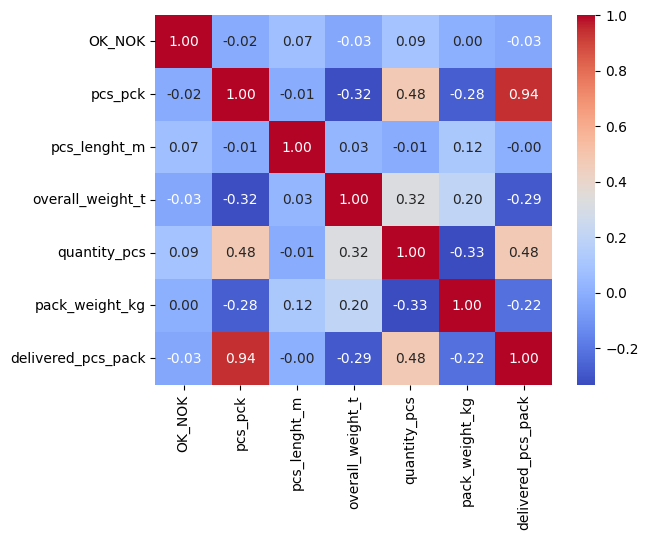

In [96]:
g = sns.heatmap(modified_df[["OK_NOK","pcs_pck", "pcs_lenght_m", "overall_weight_t", "quantity_pcs","pack_weight_kg","delivered_pcs_pack"]].corr(),annot=True, fmt = ".2f", cmap = "coolwarm")

**Comment**: While it appears that no feature exhibits a significant linear correlation with the target feature, it's important to note that this doesn't render the features useless. Subgroups within these features may still exhibit correlations with survival rates. To ascertain this, a detailed exploration of these features is necessary. Additionally, it's observed that 'pcs_pck' and 'delivered_pcs_pack' are nearly identical, suggesting redundancy. It may be advisable to remove one of them to streamline the dataset.


In [97]:
modified_df.drop('delivered_pcs_pack', axis=1, inplace=True)

**pcs_pck**

In [98]:
modified_df['pcs_pck'].value_counts()

pcs_pck
40.00     2943
20.00     1590
100.00     559
60.00      343
10.00      315
25.00       35
50.00       33
80.00        5
Name: count, dtype: int64

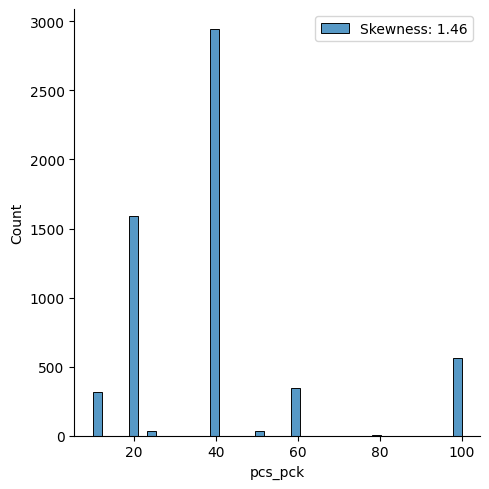

In [99]:
sns.displot(data=modified_df, x='pcs_pck', kind='hist', label='Skewness: %.2f'%(modified_df['pcs_pck'].skew()))
plt.legend(loc='best')
plt.show()

In [100]:
pcs_pck_vc = modified_df['pcs_pck'].value_counts()
filtered_pcs_pck_vc = pcs_pck_vc[pcs_pck_vc<300]
filtered_pcs_pck_vc

pcs_pck
25.00    35
50.00    33
80.00     5
Name: count, dtype: int64

**Comment** : The 'pcs_pck' numerical feature displays imbalance, skewness, and potentially large value ranges, which might impact predictive model performance. To tackle these issues, scaling the feature can help normalize its distribution and mitigate the influence of its skewed nature. Additionally, discretizing the feature into categorical bins offers an alternative method to address these challenges, potentially capturing non-linear patterns and reducing sensitivity to outliers.

In [101]:
modified_df['pcs_pck'] = modified_df['pcs_pck'].apply(lambda x: np.log(x) if x > 0 else 0)

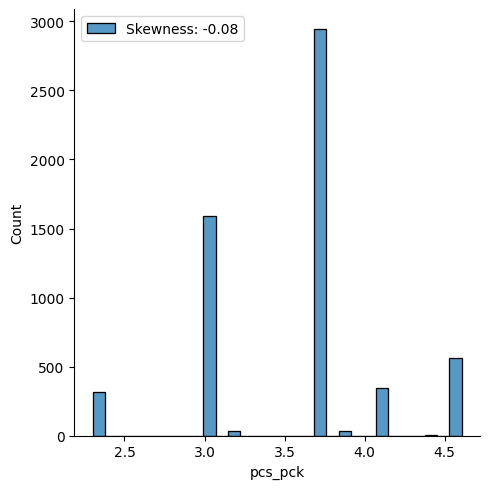

In [102]:
sns.displot(data=modified_df, x='pcs_pck', kind='hist', label='Skewness: %.2f'%(modified_df['pcs_pck'].skew()))
plt.legend(loc='best')
plt.show()

In [103]:
from sklearn.preprocessing import MinMaxScaler

pcs_pck_scaler = MinMaxScaler()

reshaped_pcs_pck = modified_df['pcs_pck'].values.reshape(-1,1)
modified_df['pcs_pck'] = pcs_pck_scaler.fit_transform(reshaped_pcs_pck)


**Comment** Add bins feature

In [104]:
 # modified_df['pcs_pck_bin'] =  modified_df['pcs_pck'].apply(lambda x: 'Other_pcs_pck' if x in filtered_pcs_pck_vc else str(x))

In [105]:
# modified_df[['pcs_pck_bin', 'OK_NOK']].groupby('pcs_pck_bin', as_index=False).mean().sort_values('OK_NOK', ascending=False)

In [106]:
# Create the plot
# sns.catplot(x='pcs_pck_bin', y='OK_NOK', data=modified_df, kind="bar", height=6, palette="muted")
# plt.show()

**pcs_lenght_m**

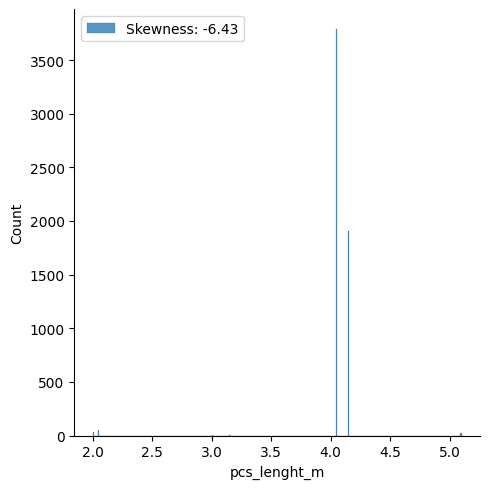

In [107]:
sns.displot(data=modified_df, x='pcs_lenght_m', kind='hist', label='Skewness: %.2f'%(modified_df['pcs_lenght_m'].skew()))
plt.legend(loc='best')
plt.show()

**Comment** From distribiution plot we can see that pcs_lenght_m column has 2 dominant values and therefore is more categorical than numerical feature.

In [108]:
pcs_lenght_m_vc = modified_df['pcs_lenght_m'].value_counts()
filterd_pcs_lenght_m_vc = pcs_lenght_m_vc[pcs_lenght_m_vc<1000]
pcs_lenght_m_vc

pcs_lenght_m
4.05    3786
4.15    1911
2.05      56
2.00      33
5.10      21
3.15      10
3.00       6
Name: count, dtype: int64

In [109]:
 modified_df['pcs_lenght_m_bin'] =  modified_df['pcs_lenght_m'].apply(lambda x: 'Other_lenght' if x in filterd_pcs_lenght_m_vc else str(x))

In [110]:
 modified_df['pcs_lenght_m_bin'].value_counts()

pcs_lenght_m_bin
4.05            3786
4.15            1911
Other_lenght     126
Name: count, dtype: int64

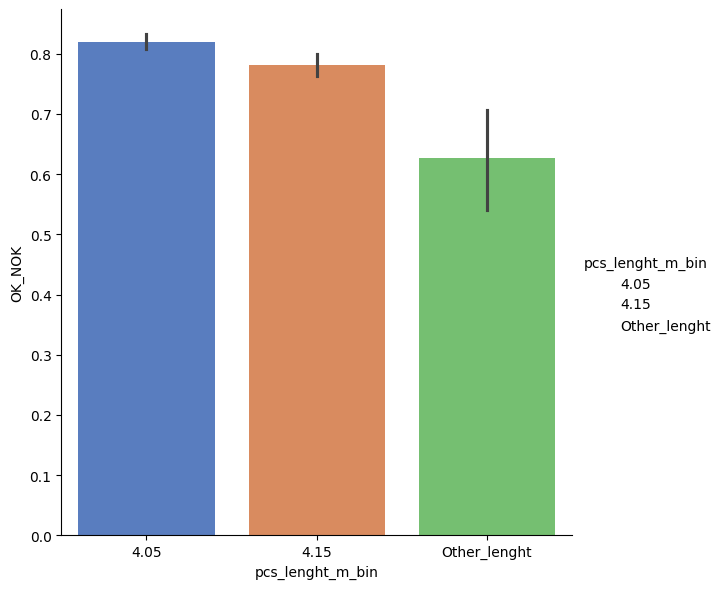

In [111]:
sns.catplot(x='pcs_lenght_m_bin', y='OK_NOK', data=modified_df, kind="bar", height=6, palette="muted")
plt.show()

In [112]:
modified_df.drop('pcs_lenght_m', axis=1, inplace=True)
modified_df.reset_index(drop=True, inplace=True)

**overall_weight_t**

In [113]:
weight_vc = modified_df['overall_weight_t'].value_counts()
weight_vc[weight_vc.index>1.5]

overall_weight_t
1.75    50
1.61    43
1.60    21
1.81    14
2.68     7
2.73     3
Name: count, dtype: int64

In [114]:
filtered_weight_vc = weight_vc[weight_vc.index<1.5]
median_overal_weight_t = modified_df.loc[modified_df['overall_weight_t'].isin(filtered_weight_vc.index), 'overall_weight_t'].median()
filtered_weight_vc_more_1_5 =  weight_vc[weight_vc.index>1.5]

In [115]:
# modified_df[modified_df['overal_weight_t'].isin(filtered_weight_vc.index)]
modified_df.loc[modified_df['overall_weight_t'].isin(filtered_weight_vc_more_1_5.index), 'overall_weight_t'] = median_overal_weight_t

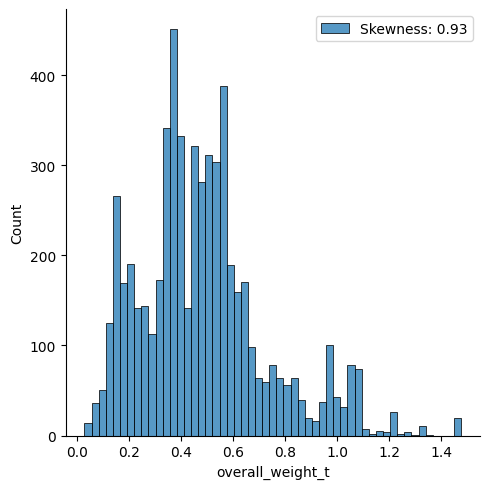

In [116]:
sns.displot(data=modified_df, x='overall_weight_t', kind='hist', label='Skewness: %.2f'%(modified_df['overall_weight_t'].skew()))
plt.legend(loc='best')
plt.show()

In [117]:
modified_df['overall_weight_t'] = modified_df['overall_weight_t'].apply(lambda x: np.log(x) if x > 0 else 0)b

In [335]:
modified_df['overall_weight_t'].h

0   -1.08
1   -0.56
2   -1.08
3   -1.08
4   -1.33
Name: overall_weight_t, dtype: float64

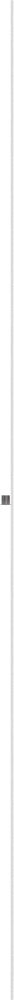

In [334]:
sns.catplot(x='overall_weight_t', y='OK_NOK', data=modified_df, kind="bar", height=6, palette="muted")
plt.show()

**Comment** Next we add bins feature

In [337]:
modified_df['overall_weight_t'].value_counts()

overall_weight_t
-0.77    150
-0.91    139
-0.96    136
-0.98    110
-0.58     99
        ... 
-0.29      1
-0.74      1
-1.64      1
-0.67      1
-0.63      1
Name: count, Length: 2664, dtype: int64

In [339]:
modified_df['overall_weight_t_bin'] = pd.cut(modified_df['overall_weight_t'], bins=5)

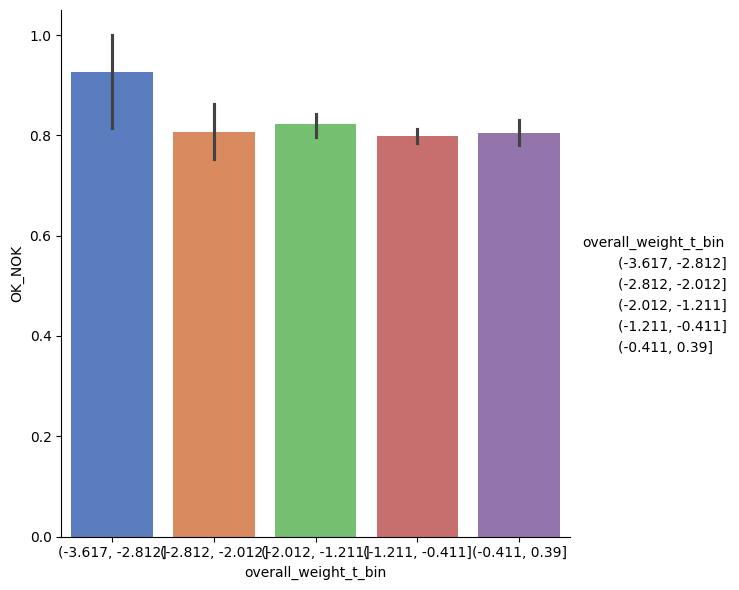

In [340]:
sns.catplot(x='overall_weight_t_bin', y='OK_NOK', data=modified_df, kind="bar", height=6, palette="muted")

**quantity_pcs** 575 dodane przez mediane(zmień typ kolumny na int) uzupełnij pod kątem 

In [121]:
modified_df['quantity_pcs'].value_counts()

quantity_pcs
574.50     1864
600.00      113
360.00       86
400.00       78
1200.00      77
           ... 
595.00        1
1181.00       1
1096.00       1
1489.00       1
2032.00       1
Name: count, Length: 897, dtype: int64

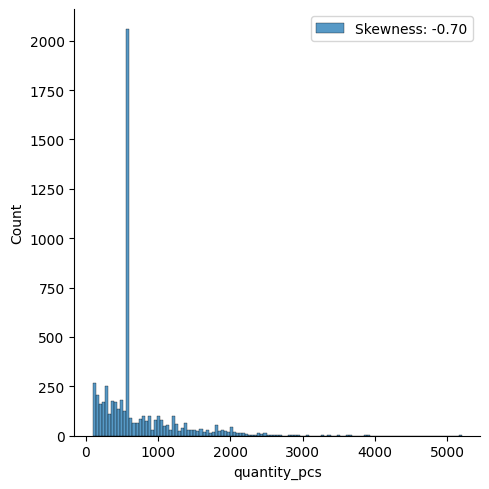

In [122]:
sns.displot(data=modified_df, x='quantity_pcs', kind='hist', label='Skewness: %.2f'%(modified_df['overall_weight_t'].skew()))
plt.legend(loc='best')
plt.show()

**Comment** Quantity is better represented as categorical feature.

In [123]:
modified_df['quantity_pcs_bin'] = pd.cut(modified_df['quantity_pcs'], bins=5)mmm

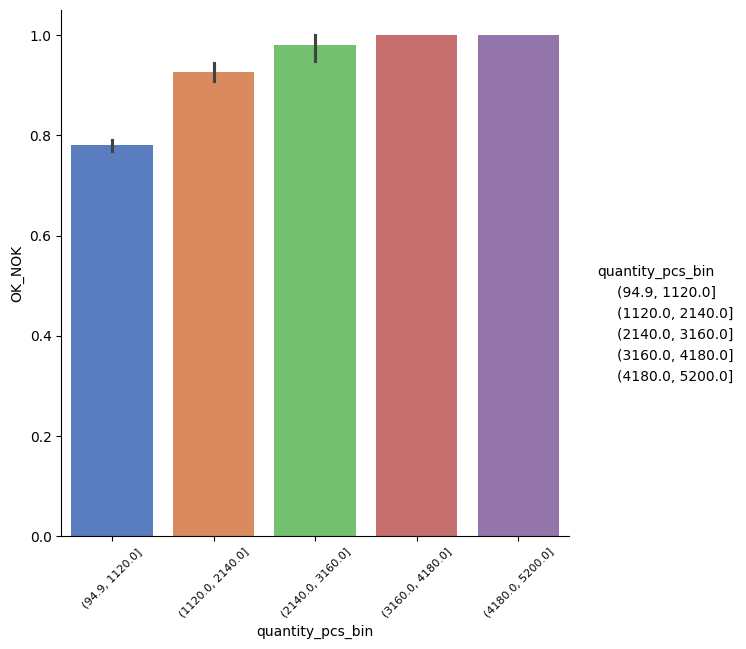

In [124]:
quantity_bin_plot = sns.catplot(x='quantity_pcs_bin', y='OK_NOK', data=modified_df, kind="bar", height=6, palette="muted")
quantity_bin_plot.set_xticklabels(rotation=45, fontsize=8)
plt.show()

In [125]:
modified_df.drop('quantity_pcs', axis=1, inplace=True)
modified_df.reset_index(drop=True, inplace=True)

**pack_weight_kg**

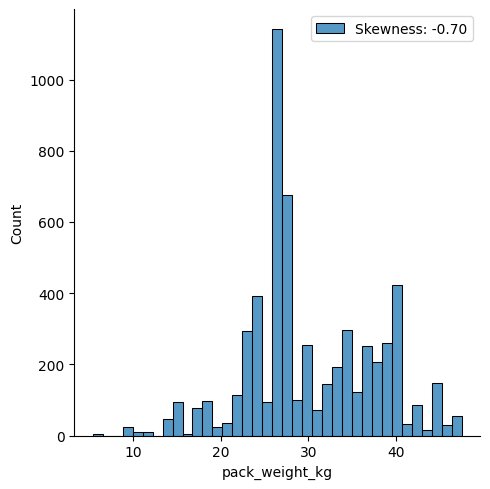

In [126]:
sns.displot(data=modified_df, x='pack_weight_kg', kind='hist', label='Skewness: %.2f'%(modified_df['overall_weight_t'].skew()))
plt.legend(loc='best')
plt.show()


In [127]:
modified_df['pack_weight_kg'] = modified_df['pack_weight_kg'].apply(lambda x: np.log(x) if x > 0 else 0)


In [128]:
pack_weight_scaler = MinMaxScaler()

reshaped_pcs_pck = modified_df['pack_weight_kg'].values.reshape(-1,1)
modified_df['pack_weight_kg'] = pack_weight_scaler.fit_transform(reshaped_pcs_pck)

**Comment** Add bin feature

In [129]:
# modified_df['pack_weight_kg_bin'] = pd.cut(modified_df['pack_weight_kg'], bins=10)

In [130]:
# pack_weight_bin_vc = modified_df['pack_weight_kg_bin'].value_counts()
# filtered_pack_weight_bin_vc = pack_weight_bin_vc[pack_weight_bin_vc<200]

In [131]:
# modified_df['pack_weight_kg_bin'] =  modified_df['pack_weight_kg_bin'].apply(lambda x: 'Other_pack_weight' if x in filtered_pack_weight_bin_vc else str(x))

In [132]:
 # modified_df['pack_weight_kg_bin'].value_counts()

In [133]:
# pack_weight_bin_plot = sns.catplot(x='pack_weight_kg_bin', y='OK_NOK', data=modified_df, kind="bar", height=6, palette="muted")
# pack_weight_bin_plot.set_xticklabels(rotation=45, fontsize=8)
# plt.show()

### 5.2 Categorical features
    *name
    *shape_no
    *drawing_no
    *surface_finish
    *supplier
    
    


**name**

In [134]:
name_vc = modified_df['name'].value_counts()
name_vc

name
Phecda         522
Procyon        458
Regor          421
Centauri       135
Telescopium    120
              ... 
Stardust         5
Altair           5
Sculptor         5
Indus            5
Coma             5
Name: count, Length: 154, dtype: int64

In [135]:
name_prob_ok_nok = modified_df.groupby('name')['OK_NOK'].mean()
name_order = name_prob_ok_nok.sort_values().index

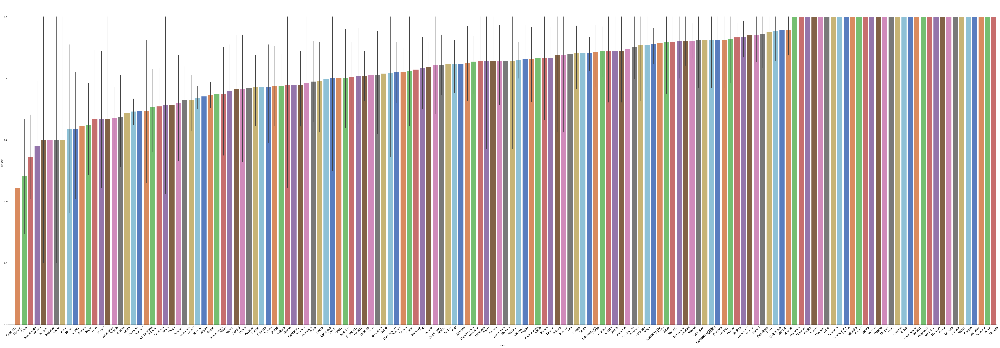

In [136]:
name_plot = sns.catplot(x='name', y='OK_NOK', data=modified_df, kind="bar", height=25, aspect=3, palette="muted", order=name_order, legend=False)
name_plot.set_xticklabels(rotation=45, fontsize=16)
plt.show()

In [137]:
pivot_table = modified_df.pivot_table(index='name', values='OK_NOK', aggfunc='mean')

# Display the pivot table
pivot_table.sort_values(by='OK_NOK', ascending=False)

,OK_NOK
name,
Megrez,1.00
Spica,1.00
Sculptor,1.00
Sargas,1.00
Cepheus,1.00
...,...
Wezen,0.58
Sadalmelik,0.55
Grus,0.48


**shape_no**

In [138]:
shape_no_vc = modified_df['shape_no'].value_counts()
# filtered_shape_no_vc_35 = shape_no_vc[shape_no_vc<=35]
shape_no_vc

shape_no
SH5      655
SH1      570
SH0      549
SH39     272
SH15     242
        ... 
SH26       5
SH70       5
SH103      5
SH104      5
SH107      5
Name: count, Length: 70, dtype: int64

In [139]:
shape_no_prob_ok_nok = modified_df.groupby('shape_no')['OK_NOK'].mean()
shape_no_order = shape_no_prob_ok_nok.sort_values().index

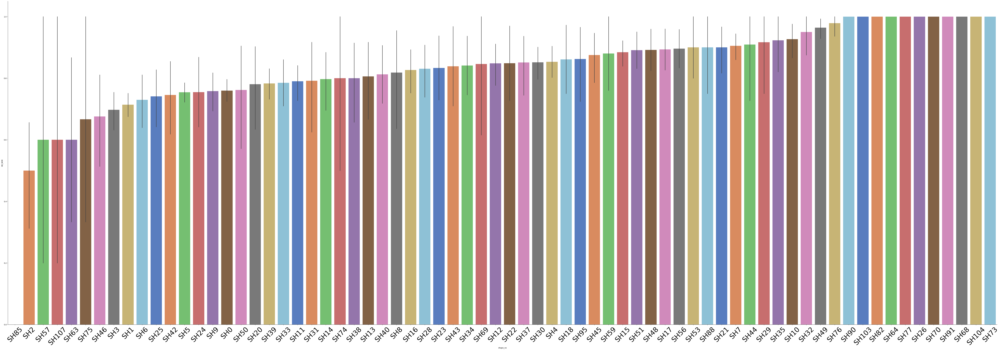

In [140]:
shape_no_plot = sns.catplot(x='shape_no', y='OK_NOK', data=modified_df, kind="bar", height=26, aspect=3, palette="muted", order=shape_no_order, legend=False)
shape_no_plot.set_xticklabels(rotation=45, fontsize=38)
plt.show()

**drawing_no**

In [141]:
drawing_no_vc = modified_df['drawing_no'].value_counts()
drawing_no_vc

drawing_no
DR5      338
DR1      296
DR10     293
DR0      283
DR20     269
        ... 
DR64       5
DR79       5
DR80       5
DR83       5
DR170      5
Name: count, Length: 106, dtype: int64

In [142]:
drawing_no_prob_ok_nok = modified_df.groupby('drawing_no')['OK_NOK'].mean()
drawing_no_order = drawing_no_prob_ok_nok.sort_values().index

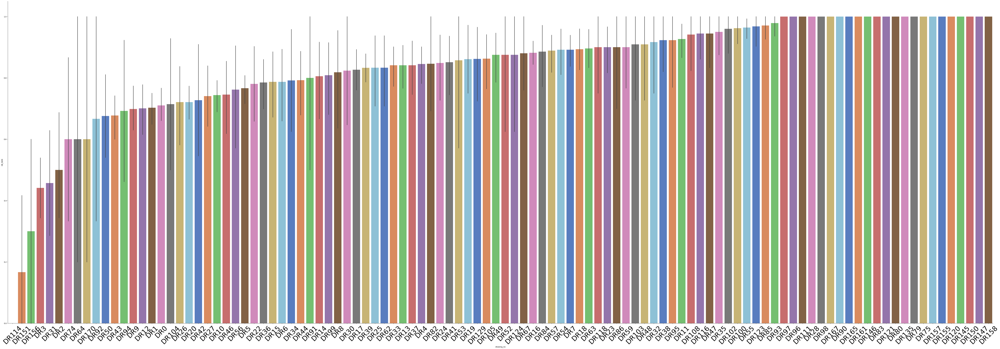

In [143]:
drawing_no_order_plot = sns.catplot(x='drawing_no', y='OK_NOK', data=modified_df, kind="bar", height=26, aspect=3, palette="muted", order=drawing_no_order, legend=False)
drawing_no_order_plot.set_xticklabels(rotation=45, fontsize=38)
plt.show()

**surface_finish**

In [144]:
surface_finish_vc = modified_df['surface_finish'].value_counts()
surface_finish_vc

surface_finish
C-0      3679
SUR      1521
C-35      617
BIAŁY       6
Name: count, dtype: int64

In [145]:
modified_df = modified_df[modified_df['surface_finish'] != "BIAŁY"]

In [146]:
surface_finish_prob_ok_nok = modified_df.groupby('surface_finish')['OK_NOK'].mean()
surface_finish_order = surface_finish_prob_ok_nok.sort_values().index

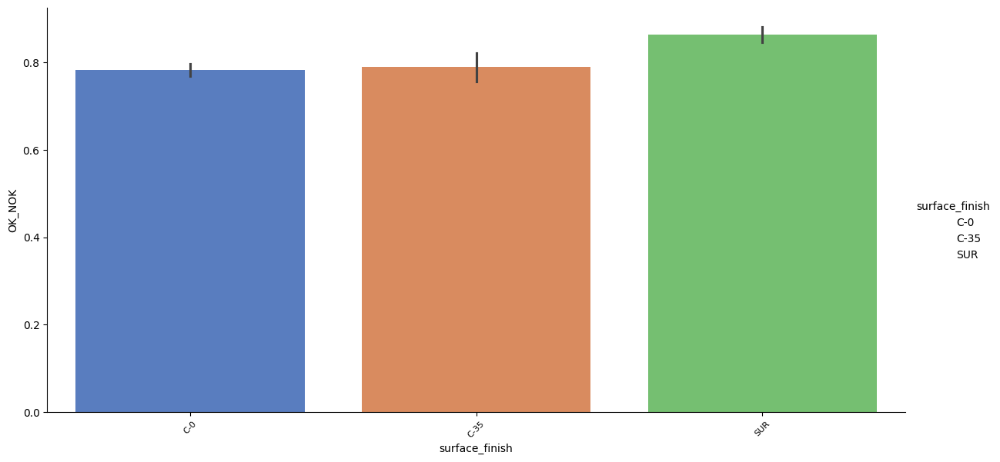

In [147]:
surface_finish_plot = sns.catplot(x='surface_finish', y='OK_NOK', data=modified_df, kind="bar", height=6, aspect=2, palette="muted", order=surface_finish_order,)
surface_finish_plot.set_xticklabels(rotation=45, fontsize=8)
plt.show()

**supplier**

In [148]:
supplier_vc = modified_df['supplier'].value_counts()
supplier_vc

supplier
SU1    4007
SU0    1613
SU2     136
SU5      25
SU3      15
SU6      12
SU4       9
Name: count, dtype: int64

In [149]:
supplier_prob_ok_nok = modified_df.groupby('supplier')['OK_NOK'].mean()
supplier_order = supplier_prob_ok_nok.sort_values().index

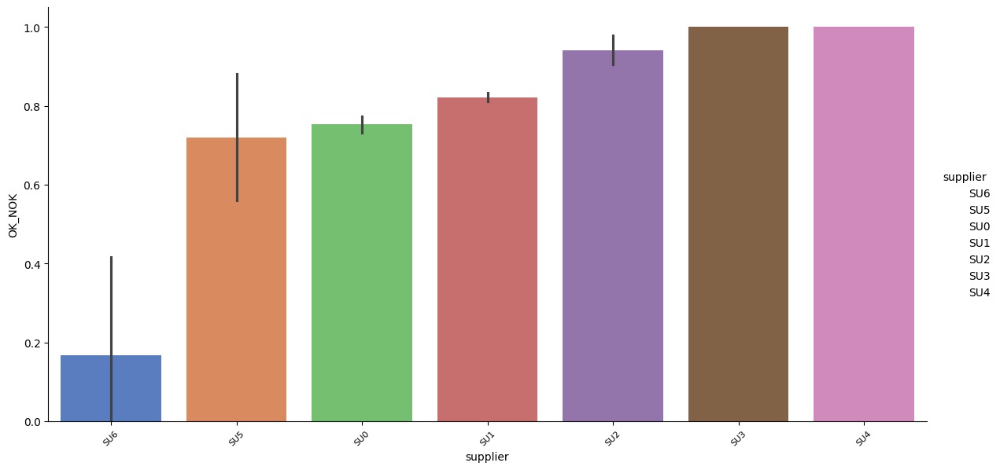

In [150]:
supplier_plot = sns.catplot(x='supplier', y='OK_NOK', data=modified_df, kind="bar", height=6, aspect=2, palette="muted", order=supplier_order,)
supplier_plot.set_xticklabels(rotation=45, fontsize=8)
plt.show()

**Comment** One hot encoding features

In [151]:
modified_df.to_csv('to_modeling_dataframe.csv', index=False)



In [152]:
dtype = {'date_fmt': 'datetime64[ns]'}
to_modeling_df = pd.read_csv('to_modeling_dataframe.csv', parse_dates=['date_fmt'])


In [153]:
to_modeling_df = pd.get_dummies(to_modeling_df, columns=['quantity_pcs_bin'], prefix='QUA')

In [154]:
to_modeling_df = pd.get_dummies(to_modeling_df, columns=['pcs_lenght_m_bin'], prefix='pLEN')

In [155]:
x = ['name','shape_no','drawing_no','surface_finish','supplier']
to_modeling_df = pd.get_dummies(to_modeling_df, columns=x)

In [156]:
to_modeling_df.head(2)

,OK_NOK,date_fmt,pcs_pck,pack_weight_kg,overall_weight_t,"QUA_(1120.0, 2140.0]","QUA_(2140.0, 3160.0]","QUA_(3160.0, 4180.0]","QUA_(4180.0, 5200.0]","QUA_(94.9, 1120.0]",...,surface_finish_C-0,surface_finish_C-35,surface_finish_SUR,supplier_SU0,supplier_SU1,supplier_SU2,supplier_SU3,supplier_SU4,supplier_SU5,supplier_SU6
0,0,2017-01-13,0.60,0.68,-1.08,False,False,False,False,True,...,True,False,False,True,False,False,False,False,False,False
1,0,2017-01-13,0.60,0.92,-0.56,False,False,False,False,True,...,True,False,False,True,False,False,False,False,False,False


In [157]:
to_modeling_df.info(5)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5817 entries, 0 to 5816
Data columns (total 350 columns):
 #    Column                Dtype         
---   ------                -----         
 0    OK_NOK                int64         
 1    date_fmt              datetime64[ns]
 2    pcs_pck               float64       
 3    pack_weight_kg        float64       
 4    overall_weight_t      float64       
 5    QUA_(1120.0, 2140.0]  bool          
 6    QUA_(2140.0, 3160.0]  bool          
 7    QUA_(3160.0, 4180.0]  bool          
 8    QUA_(4180.0, 5200.0]  bool          
 9    QUA_(94.9, 1120.0]    bool          
 10   pLEN_4.05             bool          
 11   pLEN_4.15             bool          
 12   pLEN_Other_lenght     bool          
 13   name_Aether           bool          
 14   name_Alcyone          bool          
 15   name_Aldebaran        bool          
 16   name_Alnitak          bool          
 17   name_Altair           bool          
 18   name_Aludra           bool

**Comment** Converting the 'date_fmt' column in your DataFrame 'to_modeling_df' to a numeric representation using the toordinal() function, which converts a date to its corresponding proleptic Gregorian ordinal. This essentially assigns a unique integer to each date, with earlier dates having lower ordinal values and later dates having higher ordinal values.

In [158]:
to_modeling_df['date_numeric'] = to_modeling_df['date_fmt'].apply(lambda x: x.toordinal())

In [ ]:
catplot(x='date_numeric', y ok_nok

**Comment** Subsequent to my analysis of the models and 'classifier.feature_importances_' of tree-based classifiers, it became evident that the dominant feature was 'date_numeric'. To investigate the possibility of data leakage, I performed a Pearson correlation matrix.

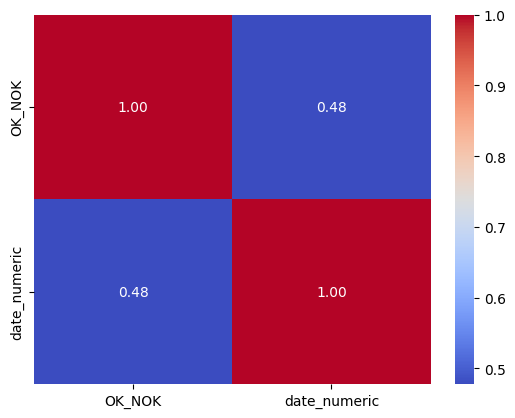

In [159]:
g = sns.heatmap(to_modeling_df[["OK_NOK", "date_numeric"]].corr(), annot=True, fmt=".2f", cmap="coolwarm")

**Comment** While the linear correlation between the 'date_numeric' feature and 'OK_NOK' suggests improvements in supplier quality over time and reflects the success of the quality department, it also raises concerns about potential data leakage. This inadvertently includes information not available during prediction, compromising model integrity. To address this, we should exclude features like 'date_numeric' from training set to ensure predictions rely solely on relevant, future-available data.

**Spliting dataset**

In [160]:
from sklearn.model_selection import train_test_split


target = to_modeling_df['OK_NOK']
features = to_modeling_df.drop(['date_fmt','OK_NOK','date_numeric'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 10, stratify=target)



### 6.1 Simple modeling
#### Cross validate models

I used 11 popular classifiers and evaluated their mean: accuracy, precision, recall, false positive rate, and Receiver Operating Characteristic (ROC) Area Under the Curve (AUC) of each of them by a stratified k-fold cross-validation procedure.

* SVC
* Decision Tree Classifier 
* AdaBoost 
* Random Forest
* Extra Trees
* Gradient Boosting
* Multiple layer perceptron (neural network)
* KNN
* Logistic regression
* Linear Discriminant Analysis
* Catboost


In [161]:
# Cross validate model with Kfold stratified cross val
from sklearn.model_selection import StratifiedKFold

kfold = StratifiedKFold(n_splits=5)
random_state = 54

Cross validation on featurres and label

In [162]:
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from catboost import CatBoostClassifier

from sklearn.model_selection import cross_validate

# Define the classifiers and scoring metrics
classifiers = [
    SVC(random_state=random_state),
    DecisionTreeClassifier(random_state=random_state),
    AdaBoostClassifier(DecisionTreeClassifier(random_state=random_state), random_state=random_state, learning_rate=0.1),
    RandomForestClassifier(random_state=random_state),
    ExtraTreesClassifier(random_state=random_state),
    GradientBoostingClassifier(random_state=random_state),
    MLPClassifier(random_state=random_state),
    KNeighborsClassifier(),
    LogisticRegression(random_state=random_state),
    LinearDiscriminantAnalysis(),
    CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6)
]

# Dictionary of scoring metrics
scoring_metrics = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

# List to hold cross-validation results for each classifier
cv_results = []

# Perform cross-validation for each classifier
for classifier in classifiers:
    cv_result = cross_validate(classifier, X_train, y=y_train, scoring=scoring_metrics, cv=kfold, n_jobs=12)
    cv_results.append(cv_result)

In [163]:
# Create a dictionary to hold the data
algorithms =["SVC","DecisionTree","AdaBoost",
"RandomForest","ExtraTrees","GradientBoosting","MultipleLayerPerceptron","KNeighboors","LogisticRegression","LinearDiscriminantAnalysis", "CatBoost"]

data = {}
data_std = {}

# Iterate over the algorithms and their corresponding results
for algorithm, result in zip(algorithms, cv_results):
    # Create a dictionary to hold the results for the current algorithm
    algorithm_results = {}
    algorithm_std = {}
    # Iterate over the metrics and their scores
    for metric, scores in result.items():
        # Add the metric and its mean score to the algorithm_results dictionary
        algorithm_results[metric] = scores.mean()
        algorithm_std[metric] = scores.std()
    # Add the algorithm and its results to the data dictionary
    data[algorithm] = algorithm_results
    data_std[algorithm] = algorithm_std

# Convert the data dictionary into a DataFrame
cv_res_df = pd.DataFrame(data).T
cv_std_df = pd.DataFrame(data_std).T

### Evaluating train set results

In [164]:
cv_res_df.sort_values(by='test_accuracy', ascending=False)

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc
CatBoost,3.19,0.28,0.82,0.83,0.98,0.90,0.80
GradientBoosting,3.51,0.02,0.82,0.83,0.98,0.90,0.79
MultipleLayerPerceptron,45.25,0.03,0.82,0.84,0.94,0.89,0.78
LogisticRegression,1.19,0.03,0.81,0.82,0.98,0.89,0.72
LinearDiscriminantAnalysis,1.32,0.03,0.80,0.82,0.97,0.89,0.72
SVC,10.61,1.94,0.80,0.81,0.98,0.89,0.69
KNeighboors,0.04,0.40,0.80,0.86,0.89,0.88,0.76
RandomForest,3.66,0.07,0.79,0.85,0.89,0.87,0.78
AdaBoost,8.65,0.09,0.78,0.86,0.88,0.87,0.76
ExtraTrees,5.57,0.08,0.78,0.86,0.87,0.86,0.76


In [165]:
cv_std_df

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc
SVC,0.08,0.04,0.01,0.01,0.01,0.00,0.02
DecisionTree,0.03,0.00,0.01,0.01,0.02,0.01,0.03
AdaBoost,1.68,0.02,0.02,0.01,0.02,0.01,0.03
RandomForest,0.02,0.01,0.01,0.01,0.02,0.01,0.03
ExtraTrees,0.05,0.01,0.02,0.01,0.02,0.01,0.03
GradientBoosting,0.03,0.00,0.01,0.01,0.01,0.01,0.01
MultipleLayerPerceptron,0.09,0.01,0.01,0.01,0.01,0.01,0.03
KNeighboors,0.01,0.01,0.00,0.01,0.01,0.00,0.03
LogisticRegression,0.02,0.01,0.01,0.01,0.01,0.00,0.02
LinearDiscriminantAnalysis,0.02,0.01,0.01,0.01,0.01,0.01,0.02


In [166]:
fit_time_mean = cv_res_df.groupby(cv_res_df.index)['fit_time'].mean()
fit_time_order = fit_time_mean.sort_values().index

In [167]:
score_time_mean = cv_res_df.groupby(cv_res_df.index)['score_time'].mean()
score_time_order = score_time_mean.sort_values().index

In [168]:
test_accuracy_mean = cv_res_df.groupby(cv_res_df.index)['test_accuracy'].mean()
test_accuracy_order = test_accuracy_mean.sort_values(ascending=False).index

In [169]:
prec_mean = cv_res_df.groupby(cv_res_df.index)['test_precision'].mean()
prec_order = prec_mean.sort_values(ascending=False).index

In [170]:
rec_mean = cv_res_df.groupby(cv_res_df.index)['test_recall'].mean()
rec_order = rec_mean.sort_values(ascending=False).index

In [171]:
f1_mean = cv_res_df.groupby(cv_res_df.index)['test_f1'].mean()
f1_order = f1_mean.sort_values(ascending=False).index

In [172]:
roc_mean = cv_res_df.groupby(cv_res_df.index)['test_roc_auc'].mean()
roc_order = roc_mean.sort_values(ascending=False).index

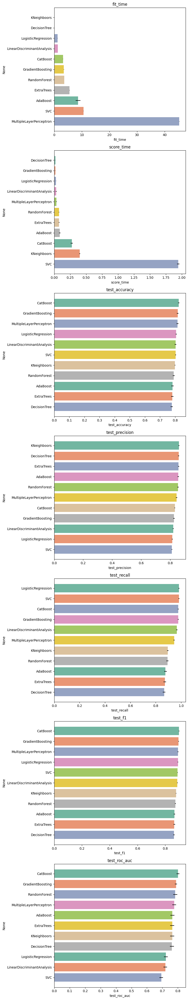

In [173]:
import matplotlib.pyplot as plt

orders = [fit_time_order, score_time_order, test_accuracy_order, prec_order, rec_order, f1_order, roc_order]

# Define the number of rows and columns
num_metrics = len(orders)
num_rows = num_metrics
num_cols = 1

# Create subplots
fig, ax = plt.subplots(num_rows, num_cols, figsize=(8, 6*num_metrics))

# Iterate over each metric
for i, metric in enumerate(cv_res_df.columns):
    # Plot the bar plot on the respective subplot
    sns.barplot(x=cv_res_df[metric], y=cv_res_df.index, data=cv_res_df, palette="Set2", orient="h", order=orders[i], ax=ax[i])
    x_error_left = cv_res_df[metric] - cv_std_df[metric] / 2
    x_error_right = cv_res_df[metric] + cv_std_df[metric] / 2
    
    # Add error bars
    ax[i].errorbar(x=cv_res_df[metric], y=cv_res_df.index, xerr=[cv_res_df[metric] - x_error_left, x_error_right - cv_res_df[metric]], fmt='none', c='black')
    
    ax[i].set_title(metric)
    

plt.tight_layout()
plt.show()


### Hyperparameter tuning for best models podział train test split.

In [174]:
from sklearn.model_selection import GridSearchCV
# KNeighboors
knn_param_grid = {'n_neighbors': range(1,21)}

# Create kNN Classifier
knn = KNeighborsClassifier()

# Create the GridSearchCV object
gs_knn = GridSearchCV(estimator=knn, param_grid=knn_param_grid, cv=kfold, scoring='accuracy', n_jobs=-1, verbose=1)

# Perform the grid search
gs_knn.fit(X_train, y_train)

# Get the best parameters and the best score
knn_best_params = gs_knn.best_params_
knn_best_score = gs_knn.best_score_
knn_best_model = gs_knn.best_estimator_

Fitting 10 folds for each of 20 candidates, totalling 200 fits


In [175]:
print(knn_best_params)
knn_best_score

{'n_neighbors': 15}


0.8113087821311552

In [176]:
# CatBoost
catboost_param_grid = {
    'iterations': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'depth': [3, 5, 7]
}

# Initialize CatBoost classifier
catboost = CatBoostClassifier()

# Initialize GridSearchCV
catboost_grid_search = GridSearchCV(catboost, catboost_param_grid, cv=kfold, scoring='accuracy', n_jobs=-1, verbose=1)

# Perform grid search
catboost_grid_search.fit(X_train, y_train)

# Get the best hyperparameters
catboost_best_params = catboost_grid_search.best_params_
catboost_best_accuracy = catboost_grid_search.best_score_
catboost_best_model = catboost_grid_search.best_estimator_


Fitting 10 folds for each of 27 candidates, totalling 270 fits
0:	learn: 0.6132279	total: 136ms	remaining: 27.1s
1:	learn: 0.5582759	total: 140ms	remaining: 13.9s
2:	learn: 0.5160713	total: 144ms	remaining: 9.45s
3:	learn: 0.4891886	total: 148ms	remaining: 7.27s
4:	learn: 0.4765148	total: 152ms	remaining: 5.94s
5:	learn: 0.4655590	total: 156ms	remaining: 5.05s
6:	learn: 0.4598105	total: 160ms	remaining: 4.4s
7:	learn: 0.4486694	total: 164ms	remaining: 3.93s
8:	learn: 0.4435076	total: 168ms	remaining: 3.57s
9:	learn: 0.4352713	total: 172ms	remaining: 3.27s
10:	learn: 0.4303347	total: 176ms	remaining: 3.02s
11:	learn: 0.4242865	total: 181ms	remaining: 2.83s
12:	learn: 0.4223896	total: 184ms	remaining: 2.65s
13:	learn: 0.4212871	total: 188ms	remaining: 2.5s
14:	learn: 0.4197585	total: 192ms	remaining: 2.37s
15:	learn: 0.4186157	total: 196ms	remaining: 2.25s
16:	learn: 0.4160403	total: 200ms	remaining: 2.15s
17:	learn: 0.4142560	total: 204ms	remaining: 2.06s
18:	learn: 0.4125774	total: 208

In [177]:
print(catboost_best_params)
catboost_best_accuracy


{'depth': 5, 'iterations': 200, 'learning_rate': 0.2}


0.824631962711708

In [178]:
# Gradient Boosting
gb_param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7]
}

# Create the GradientBoostingClassifier
gb_clf = GradientBoostingClassifier(random_state=42)

# Create the GridSearchCV object
gs_gb_clf = GridSearchCV(estimator=gb_clf, param_grid=gb_param_grid, cv=kfold, scoring='accuracy', n_jobs=-1, verbose=1)

# Perform the grid search
gs_gb_clf.fit(X_train, y_train)

# Get the best parameters and the best score
gb_best_params = gs_gb_clf.best_params_
gb_best_score = gs_gb_clf.best_score_
gb_best_model = gs_gb_clf.best_estimator_


Fitting 10 folds for each of 27 candidates, totalling 270 fits


In [179]:
print(gb_best_params)
gb_best_score

{'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}


0.8239849554663344

In [327]:
#  Random Forest
rf_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 5, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Create the GradientBoostingClassifier
random_forest = RandomForestClassifier(random_state=54)

# Create the GridSearchCV object
gs_random_forest = GridSearchCV(random_forest, param_grid=rf_param_grid, cv=kfold, scoring='f1', n_jobs=-1, verbose=1)

# Perform the grid search
gs_random_forest.fit(X_train, y_train)

# Get the best parameters and the best score
gs_random_forest_best_params = gs_random_forest.best_params_
gs_random_forest_best_score = gs_random_forest.best_score_
rf_best_model = gs_random_forest.best_estimator_


Fitting 10 folds for each of 108 candidates, totalling 1080 fits


KeyboardInterrupt: 

In [181]:
print(gs_random_forest_best_params)
gs_random_forest_best_score

{'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 10, 'n_estimators': 200}


0.823770824680419

In [182]:
# Adaboost
DTC = DecisionTreeClassifier()

adaDTC = AdaBoostClassifier(DTC, random_state=7)

ada_param_grid = {"base_estimator__criterion" : ["gini", "entropy"],
              "base_estimator__splitter" :   ["best", "random"],
              "algorithm" : ["SAMME","SAMME.R"],
              "n_estimators" :[1,2],
              "learning_rate":  [0.0001, 0.001, 0.01, 0.1, 0.2, 0.3,1.5]}

gs_ada_DTC = GridSearchCV(adaDTC,param_grid = ada_param_grid, cv=kfold, scoring="accuracy", n_jobs= 12, verbose = 1)

gs_ada_DTC.fit(X_train,y_train)

gs_ada_DTC_best_params = gs_ada_DTC.best_params_
gs_ada_DTC_best_score = gs_ada_DTC.best_score_
ada_best_model = gs_ada_DTC.best_estimator_


Fitting 10 folds for each of 112 candidates, totalling 1120 fits


In [183]:
print(gs_ada_DTC_best_params)
gs_ada_DTC_best_score

{'algorithm': 'SAMME', 'base_estimator__criterion': 'gini', 'base_estimator__splitter': 'best', 'learning_rate': 0.0001, 'n_estimators': 1}


0.7779892934607042

### Plot learning curves

Learning curves are a good way to see the overfitting effect on the training set and the effect of the training size on the accuracy.

In [328]:
from sklearn.model_selection import learning_curve

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    """Generate a simple plot of the test and training learning curve"""
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes, scoring='f1')
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt
    

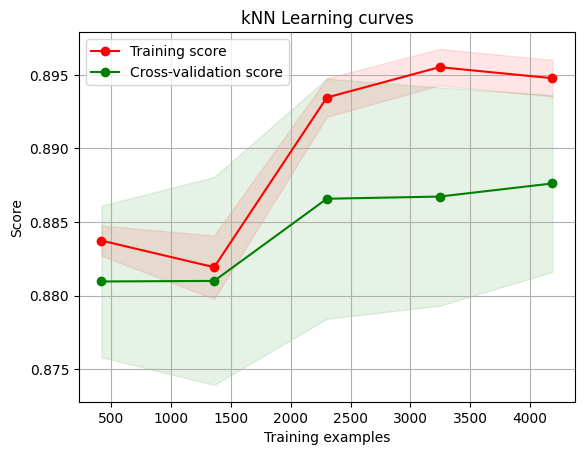

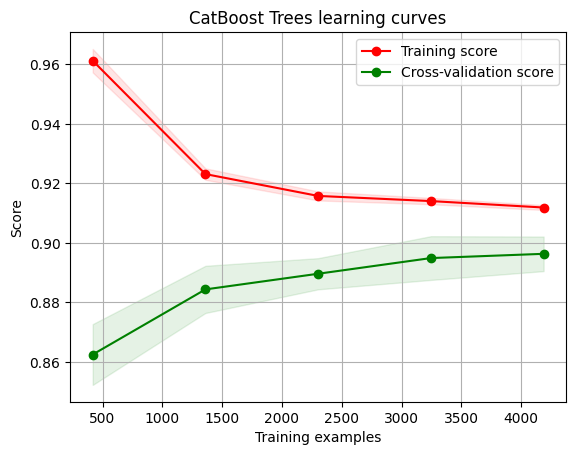

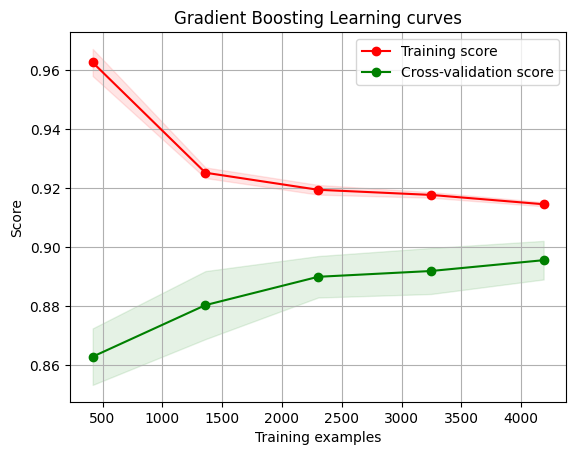

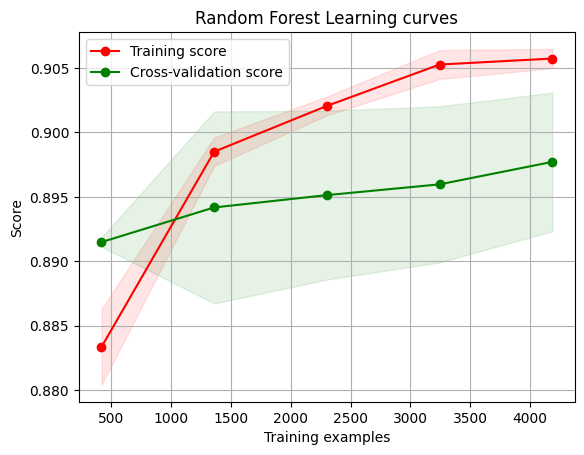

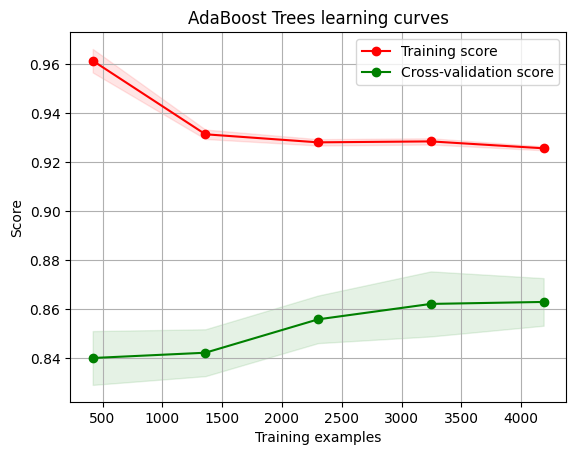

In [333]:
plot_learning_curve(knn_best_model,"kNN Learning curves",X_train,y_train,cv=kfold)
plot_learning_curve(catboost_best_model,"CatBoost Trees learning curves",X_train,y_train,cv=kfold)
plot_learning_curve(gb_best_model,"Gradient Boosting Learning curves",X_train,y_train,cv=kfold)
plot_learning_curve(rf_best_model,"Random Forest Learning curves",X_train,y_train,cv=kfold)
plot_learning_curve(ada_best_model,"AdaBoost Trees learning curves",X_train,y_train,cv=kfold)

# ada_best_model = gs_ada_DTC.best_estimator_
# rf_best_model = gs_random_forest.best_estimator_
# gb_best_model = gs_gb_clf.best_estimator_
# catboost_best_model = catboost_grid_search.best_estimator_
# knn_best_model

plt.show()

### Feature importance of the tree-based classifiers

In order to see the most informative features for the prediction of incoming goods, I displayed the feature importance for the 4 tree based classifiers.

In [186]:
print(np.argsort(catboost_best_model.feature_importances_)[::-1][:20])

[  2   0   1 207   3 302   7 338 340 341  60 282 343 246 229 206 164 339
 162 325]


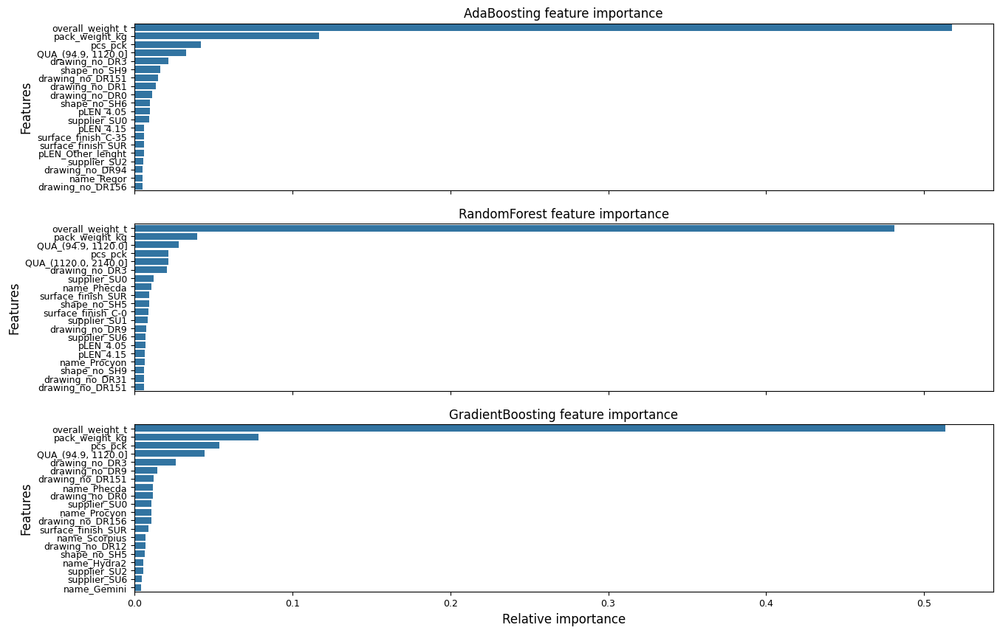

In [187]:
nrows = 3
ncols = 1
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, sharex="all", figsize=(15,10))

names_classifiers = [('AdaBoosting', ada_best_model),('RandomForest',rf_best_model),('GradientBoosting',gb_best_model)]

nclassifier = 0
for row in range(nrows):
    name = names_classifiers[nclassifier][0]
    classifier = names_classifiers[nclassifier][1]
    indices = np.argsort(classifier.feature_importances_)[::-1][:20]
    
    g = sns.barplot(y=X_train.columns[indices][:20],x = classifier.feature_importances_[indices][:20] , orient='h',ax=axes[row])
    g.set_xlabel("Relative importance",fontsize=12)
    g.set_ylabel("Features",fontsize=12)
    g.tick_params(labelsize=9)
    g.set_title(name + " feature importance")
    nclassifier += 1

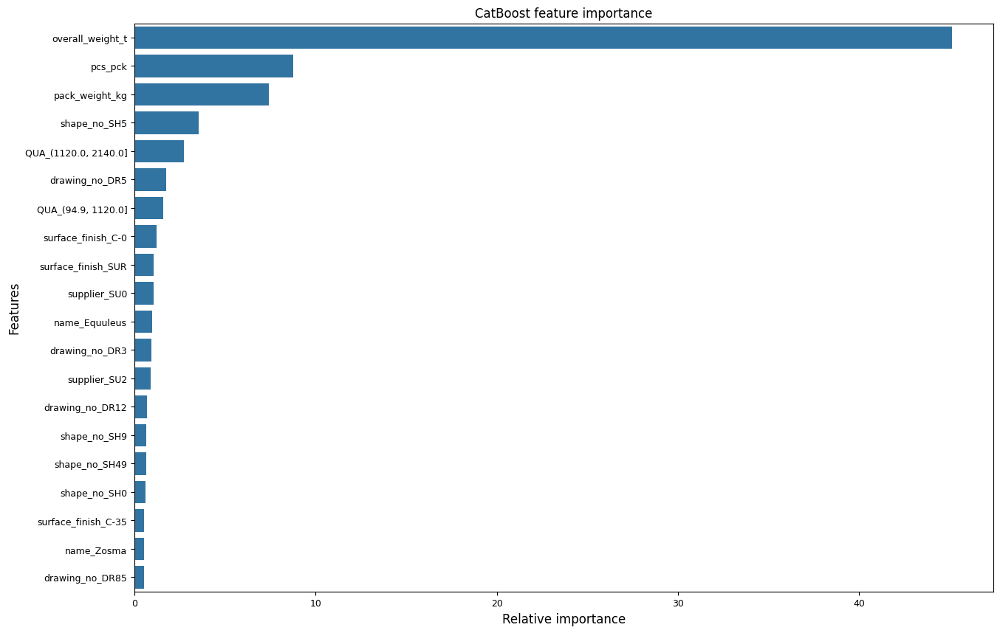

In [188]:
nrows = 1
ncols = 1
fig, axes = plt.subplots(nrows = nrows, ncols = ncols, sharex="all", figsize=(15,10))

names_classifiers = [('CatBoost',catboost_best_model)]

nclassifier = 0


name = names_classifiers[nclassifier][0]
classifier = names_classifiers[nclassifier][1]
indices = np.argsort(classifier.feature_importances_)[::-1][:20]

g = sns.barplot(y=X_train.columns[indices][:20],x = classifier.feature_importances_[indices][:40] , orient='h',ax=axes)
g.set_xlabel("Relative importance",fontsize=12)
g.set_ylabel("Features",fontsize=12)
g.tick_params(labelsize=9)
g.set_title(name + " feature importance")
nclassifier += 1

**Comment** Now let's see the performance of those models on unseen data

In [ ]:
>>> from sklearn.datasets import load_iris
>>> from sklearn.feature_selection import SelectKBest
>>> from sklearn.feature_selection import f_classif
>>> X, y = load_iris(return_X_y=True)
>>> X.shape
(150, 4)
>>> X_new = SelectKBest(f_classif, k=2).fit_transform(X, y)
>>> X_new.shape
(150, 2)

### Using chosen models with test set

In [189]:
trained_models = [
knn_best_model,
catboost_best_model,
gb_best_model,
rf_best_model,
ada_best_model
    
]

cross_val_model_res = []

for model in trained_models:
    cross_val = cross_validate(model, X_test, y=y_test, cv=kfold, scoring=scoring_metrics, n_jobs=-1)
    cross_val_model_res.append(cross_val)

### Evaluating test set results

In [190]:
names_classifiers = ['kNN','CatBoost', 'GradientBoosting', 'RandomForest','AdaBoost']

data = {}
data_std = {}
for classifier, results in zip(names_classifiers, cross_val_model_res):
    algorithm_result = {}
    algorithm_std = {}
    for metric, result in results.items():
        algorithm_result[metric] = result.mean()
        algorithm_std[metric] = result.std()
    data[classifier] = algorithm_result
    data_std[classifier] = algorithm_std
    

cv_tmodel_test_df = pd.DataFrame(data).T
cv_tmodel_test_df.sort_values(by='test_accuracy', ascending=False)

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc
RandomForest,1.09,0.06,0.79,0.81,0.97,0.88,0.72
CatBoost,2.09,0.10,0.78,0.84,0.90,0.87,0.75
GradientBoosting,3.21,0.02,0.78,0.84,0.90,0.87,0.73
kNN,0.02,0.04,0.77,0.83,0.91,0.87,0.68
AdaBoost,0.05,0.02,0.74,0.86,0.81,0.83,0.64


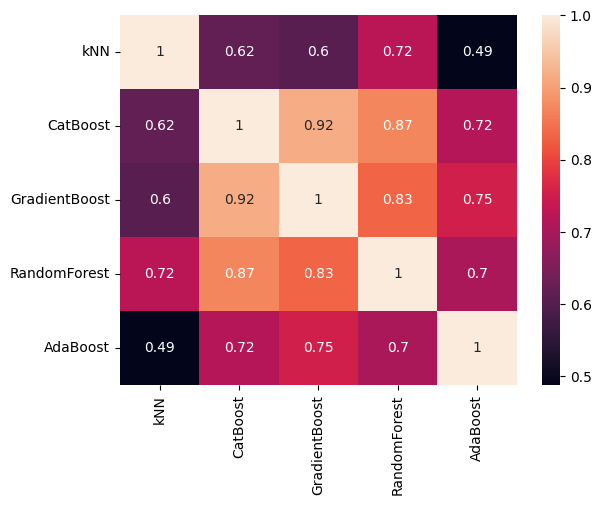

In [191]:
test_IG_kNN = pd.Series(knn_best_model.predict(X_test), name='kNN')
test_IG_CatBoost = pd.Series(catboost_best_model.predict(X_test), name='CatBoost')
test_IG_GradientBoost = pd.Series(gb_best_model.predict(X_test), name='GradientBoost')
test_IG_RandomForest = pd.Series(rf_best_model.predict(X_test), name='RandomForest')
test_IG_AdaBoost = pd.Series(ada_best_model.predict(X_test), name='AdaBoost')


# Concatenate all classifier results
ensemble_results = pd.concat([test_IG_kNN,test_IG_CatBoost,test_IG_GradientBoost,test_IG_RandomForest, test_IG_AdaBoost],axis=1)


g= sns.heatmap(ensemble_results.corr(),annot=True)

**Comment** The 5 classifiers give more or less the same prediction but there is some differences. Theses differences between the 5 classifier predictions are sufficient to consider an ensembling vote.

### 6.2 Ensemble modelings

In [192]:
from sklearn.ensemble import VotingClassifier

votingC = VotingClassifier(estimators=[
    ('AdaBoosting', ada_best_model),('RandomForest', rf_best_model),('GradientBoosting', gb_best_model),('CatBoost',catboost_best_model)], voting='soft', n_jobs=-1)

votingC = votingC.fit(X_train, y_train)


In [193]:
from sklearn.metrics import accuracy_score
y_pred = votingC.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
accuracy

0.8067010309278351

In [194]:
votingC_res = []

cross_val = cross_validate(votingC, X_test, y=y_test, cv=kfold, scoring=scoring_metrics, n_jobs=-1)
votingC_res.append(cross_val)

In [195]:
voting_data = {}

for result in votingC_res:
    algorithm_result = {}
    for metric, result in result.items():
        algorithm_result[metric] = result.mean()
    voting_data['VotingC'] = algorithm_result

    

votingC_df = pd.DataFrame(voting_data).T
votingC_df

,fit_time,score_time,test_accuracy,test_f1,test_precision,test_recall,test_roc_auc
VotingC,6.81,0.17,0.78,0.86,0.85,0.87,0.73


### 6.3 Prediction

Transformations to columns:
  
    * pcs_pck - log transformation and MinMax: pcs_pck_scaler
    * pcs_length_mm - bins
    * overall_weight_kg - log transformation
    * quantity_pcs - bins
    * pack_weight_kg - log transformation and MinMax: pack_weight_scaler
    * delivered_pcs_pack - dropped

(DR167, C-0, Indus)        5
(DR151, C-0, Regor)        5
(DR157, C-0, Centauri)     5
(DR155, C-0, Stardust)     5
(DR165, C-0, Sculptor)     5
(DR150, C-0, Procyon)      5
(DR161, C-0, Altair)       5
(DR2, SUR, Ecliptic)       5
(DR118, SUR, Sualocin)     5
(DR108, SUR, Norma)        5
(DR108, C-0, Equuleus)     5
(DR28, C-0, Horologium)    5
(DR96, C-0, Octans)        5
(DR83, SUR, Diphda)        5
(DR80, C-0, Mirfak)        5
(DR79, C-0, Taurus)        5
(DR64, C-0, Lunara)        5
(DR170, C-35, Coma)        5
Name: count, dtype: int64

In [199]:
modified_df.loc[(modified_df['drawing_no'] == "DR108") & (modified_df['surface_finish']=='C-0') & (modified_df['name'] == 'Equuleus')]

,OK_NOK,date_fmt,name,shape_no,drawing_no,surface_finish,supplier,pcs_pck,pack_weight_kg,overall_weight_t,pcs_lenght_m_bin,quantity_pcs_bin
3124,1,2020-07-21,Equuleus,SH11,DR108,C-0,SU1,0.60,0.83,-0.39,4.15,"(94.9, 1120.0]"
3179,1,2020-08-11,Equuleus,SH11,DR108,C-0,SU1,0.60,0.83,-0.50,4.15,"(94.9, 1120.0]"
3654,1,2021-02-02,Equuleus,SH11,DR108,C-0,SU1,0.60,0.83,-0.82,4.15,"(94.9, 1120.0]"
3655,1,2021-02-02,Equuleus,SH11,DR108,C-0,SU1,0.60,0.83,-0.99,4.15,"(94.9, 1120.0]"
3687,1,2021-02-09,Equuleus,SH11,DR108,C-0,SU1,0.60,0.83,-1.59,4.15,"(94.9, 1120.0]"


In [205]:
list(to_modeling_df.columns)


['OK_NOK',
 'date_fmt',
 'pcs_pck',
 'pack_weight_kg',
 'overall_weight_t',
 'QUA_(1120.0, 2140.0]',
 'QUA_(2140.0, 3160.0]',
 'QUA_(3160.0, 4180.0]',
 'QUA_(4180.0, 5200.0]',
 'QUA_(94.9, 1120.0]',
 'pLEN_4.05',
 'pLEN_4.15',
 'pLEN_Other_lenght',
 'name_Aether',
 'name_Alcyone',
 'name_Aldebaran',
 'name_Alnitak',
 'name_Altair',
 'name_Aludra',
 'name_Andromeda',
 'name_Andromeda2',
 'name_Antlia',
 'name_Apollo1',
 'name_Apollo2',
 'name_Apus',
 'name_Aquarius',
 'name_Aquarius2',
 'name_Ara',
 'name_Arcturus',
 'name_Aries1',
 'name_Aries2',
 'name_Astraeus',
 'name_Bellatrix',
 'name_Bootes',
 'name_Camelopardalis',
 'name_Cancer',
 'name_Canes',
 'name_Canis',
 'name_Canopus',
 'name_Capricorn1',
 'name_Capricornus',
 'name_Cassiopeia',
 'name_Cassiopeia1',
 'name_Centauri',
 'name_Centauri1',
 'name_Cepheus',
 'name_Ceti',
 'name_Chiselhurst',
 'name_Coma',
 'name_Cosmo',
 'name_Cosmos',
 'name_Delphinus',
 'name_Denebola',
 'name_Diphda',
 'name_Dorado',
 'name_Draco',
 'name_

In [206]:
# to_modeling_df = pd.get_dummies(to_modeling_df, columns=['quantity_pcs_bin'], prefix='QUA')
# to_modeling_df = pd.get_dummies(to_modeling_df, columns=['pcs_lenght_m_bin'], prefix='pLEN')
# x = ['name','shape_no','drawing_no','surface_finish','supplier']
# to_modeling_df = pd.get_dummies(to_modeling_df, columns=x)

KeyError: "None of [Index(['name', 'shape_no', 'drawing_no', 'surface_finish', 'supplier'], dtype='object')] are in the [columns]"

In [207]:
to_modeling_df.loc[3124]

OK_NOK                                1
date_fmt            2020-07-21 00:00:00
pcs_pck                            0.60
pack_weight_kg                     0.83
overall_weight_t                  -0.39
                           ...         
supplier_SU3                      False
supplier_SU4                      False
supplier_SU5                      False
supplier_SU6                      False
date_numeric                     737627
Name: 3124, Length: 351, dtype: object

In [208]:
X = to_modeling_df.loc[3124].copy()
Y = X['OK_NOK']  # Extracting the target variable
X = X.drop(['date_fmt', 'OK_NOK', 'date_numeric'], axis=0)  # Dropping columns from the feature matrix
X = X.values.reshape(1, -1)
y_pred = votingC.predict(X)

In [209]:
y_pred[0]

1

In [210]:
Y

1

### Lower frequency class prediction(less then 50 deliveries)

In [308]:
to_modeling_df.shape

(5817, 351)

In [307]:
modified_df.shape

(5817, 12)

In [315]:
combo_counts = modified_df[['drawing_no', 'surface_finish', 'name']].apply(tuple, axis=1)
vc_combo_counts = combo_counts.value_counts()
sliced_vc_combo_counts = vc_combo_counts[vc_combo_counts<50]
filtered_rows_df = modified_df[combo_counts.isin(sliced_vc_combo_counts[sliced_vc_combo_counts].index)]
filtered_rows_df_idx = filtered_rows_df.index
# len(sliced_vc_combo_counts)
filtered_rows_df_idx

Index([   4,   17,   18,   36,   37,   38,   43,   44,   48,   49,
       ...
       5774, 5788, 5789, 5799, 5801, 5802, 5810, 5811, 5815, 5816],
      dtype='int64', length=1275)

In [318]:
low_class_to_predict_df = to_modeling_df.loc[filtered_rows_df_idx]
low_class_to_predict_df.shape

(1275, 351)

In [276]:
# low_class_to_predict_df = low_class_to_predict_df.drop(['date_fmt', 'OK_NOK', 'date_numeric'], axis=1)

In [319]:
columns_to_keep_features = [col for col in low_class_to_predict_df.columns if col not in ['date_fmt', 'OK_NOK','date_numeric']]
low_class_to_predict_df_features = low_class_to_predict_df[columns_to_keep_features]

columns_to_keep_target = [col for col in low_class_to_predict_df.columns if col in ['OK_NOK']]
low_class_to_predict_df_labels = low_class_to_predict_df[columns_to_keep_target]



In [321]:
print(low_class_to_predict_df_features.shape)
low_class_to_predict_df_labels.shape

(1275, 348)


(1275, 1)

In [322]:
features = low_class_to_predict_df_features.copy()
labels = low_class_to_predict_df_labels
y_pred = votingC.predict(features)

In [323]:
y_pred

array([0, 0, 0, ..., 1, 1, 1], dtype=int64)

In [324]:
from sklearn.metrics import accuracy_score

accuracy_score(labels, y_pred)


0.8650980392156863

In [325]:
y_pred.shape

(1275,)

In [326]:
features.shape

(1275, 348)

zmienne vs target, class imbalance